In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrowPatch
from matplotlib.gridspec import GridSpecFromSubplotSpec
from matplotlib.patheffects import withStroke

import networkx as nx

import os
import os.path as op

import importlib

import dgsp
import graph_examples as dgsp_graphs
import plotting as dgsp_plot

import bimod_plots as plot

In [2]:
path_to_figures = "./figures/01-BiMod"

os.makedirs(path_to_figures, exist_ok=True)

inch_to_cm = 2.54
cm_to_inch = 1/inch_to_cm

([], [])

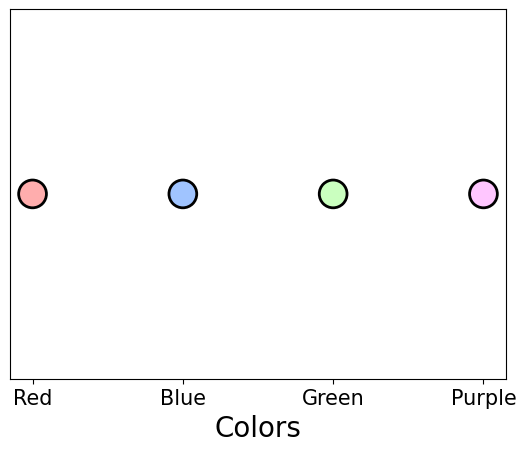

In [3]:
from matplotlib.colors import to_rgb
# Red, Blue, Green, Purple
colorpalette = ["#FFADAD", "#A0C4FF", "#CAFFBF", "#FFC6FF"]
palette_rgb = [to_rgb(color) for color in colorpalette]
colors_edges = np.array(["tab:red", "tab:blue", "tab:green", "tab:gray"])
markers = ["s", "o", "D", "^"]

# Defining edge alphas and connection styles
edge_a=.2
edge_cs="arc3,rad=0.2"

plt.scatter([0, 1, 2, 3], [0]*4, c=palette_rgb, s=400, edgecolors="k", lw=2)

plt.xlabel("Colors", fontsize=20)
plt.xticks([0, 1, 2, 3], ["Red", "Blue", "Green", "Purple"], fontsize=15)

plt.yticks([])

# Toy scheme and plot (Figure 1)

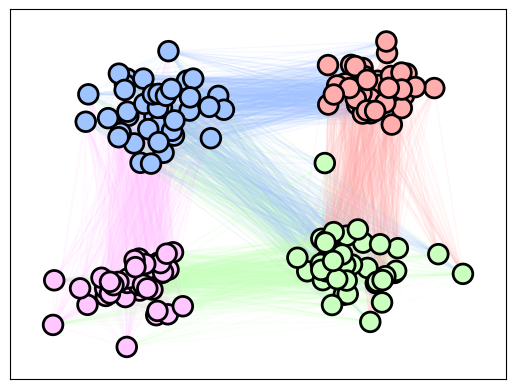

In [4]:
n_per_com = 40
density_value = 0.3

graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       density_value, density_value, density_value],
                                      connect_out_prob=[1, 0, 0, 0.5, 1, 0], seed=1234)

vector_id = 0

n_nodes = n_per_com * 4
colors = [palette_rgb[i//n_per_com] for i in np.arange(n_nodes)]

nx_graph = nx.DiGraph(graph)

edge_list = list(nx_graph.edges())
edge_colors = [palette_rgb[i] for i in np.array(nx_graph.edges())[:, 1]//n_per_com]

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph), fix_negative=False)
V = Vh.T

graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
nx_graph = nx.Graph(graph)
nx.draw_networkx_edges(nx_graph, pos=graph_pos, alpha=.1, edge_color=edge_colors, edgelist=edge_list)
plt.scatter(U[:, vector_id], V[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

234
234


Text(0.5, 1.0, 'Sorted by $u_0$ (rows) and $v_0$ (columns)')

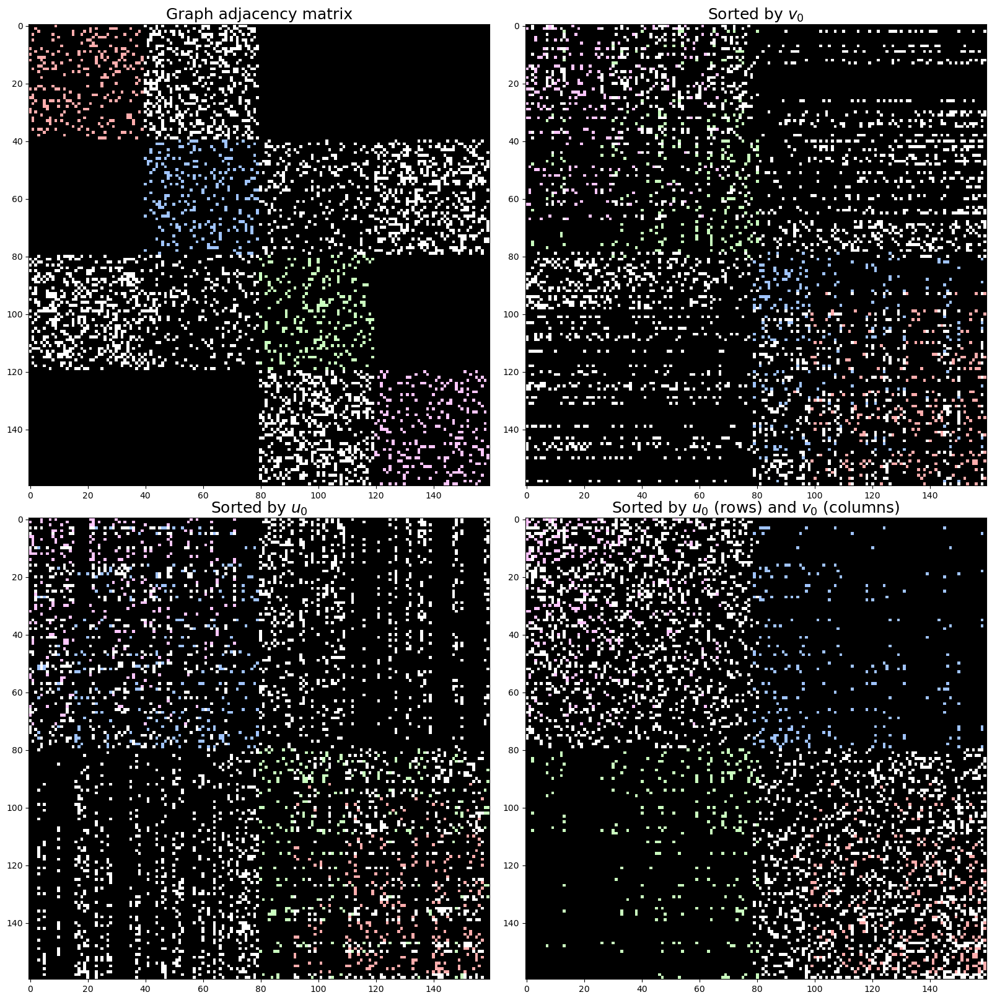

In [5]:
graph_svd = graph.copy()
graph_plot = graph.copy()
for i in range(4):
    com_slice = slice(i * n_per_com, (i + 1) * n_per_com)
    graph_plot[com_slice, com_slice] = graph[com_slice, com_slice] * (i + 2)
    if i > 0 and i < 3:
        within_com = graph_plot[com_slice, com_slice]
        #graph_svd[com_slice, com_slice] = 0
        #graph_plot[com_slice, com_slice] = 0
        print(len(np.where(within_com)[0]))

cmap = plot.get_custom_cmap()

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20), gridspec_kw={"hspace":0.07, "wspace":0.07})

#plot.plot_adjacency(graph, ax=axes[0, 0])
axes[0, 0].imshow(graph_plot, cmap=cmap, interpolation="none")
axes[0, 0].set_title("Graph adjacency matrix", fontsize=18)

U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph_svd, null_model="outin"))
V = Vh.T

sort_by_U = np.argsort(U[:, 0])
sort_by_V = np.argsort(V[:, 0])

axes[1, 0].imshow(graph_plot[sort_by_U][:, sort_by_U], cmap=cmap, interpolation="none")
axes[1, 0].set_title("Sorted by $u_0$", fontsize=18)
axes[0, 1].imshow(graph_plot[sort_by_V][:, sort_by_V], cmap=cmap, interpolation="none")
axes[0, 1].set_title("Sorted by $v_0$", fontsize=18)
axes[1, 1].imshow(graph_plot[sort_by_U][:, sort_by_V], cmap=cmap, interpolation="none")
axes[1, 1].set_title("Sorted by $u_0$ (rows) and $v_0$ (columns)", fontsize=18)

In [222]:
n_per_com = 40
density_value = .5
show_n_eig = 20
fontscale = 1

n_ideal_dir = 0
vector_id = 0

# Building the graph
graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
                                      connect_density=[density_value, density_value, 0, 
                                                       0, density_value, density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[1-n_ideal_dir, 0+n_ideal_dir, 0.5, 0.5, 1-n_ideal_dir, 0+n_ideal_dir], seed=1234)

#graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value/5,
#                                      connect_density=[density_value/10, density_value/10, density_value, 
#                                                       density_value, density_value/10, density_value/10],
#                                      #connect_density=[1, 1, 0, 1, 1, 1],
#                                      connect_out_prob=[0.5, 0.5, 0.9, 0.9, 0.5, 0.5], seed=1234)

Text(0, 0.5, 'Right singular vector $v_{1}$')

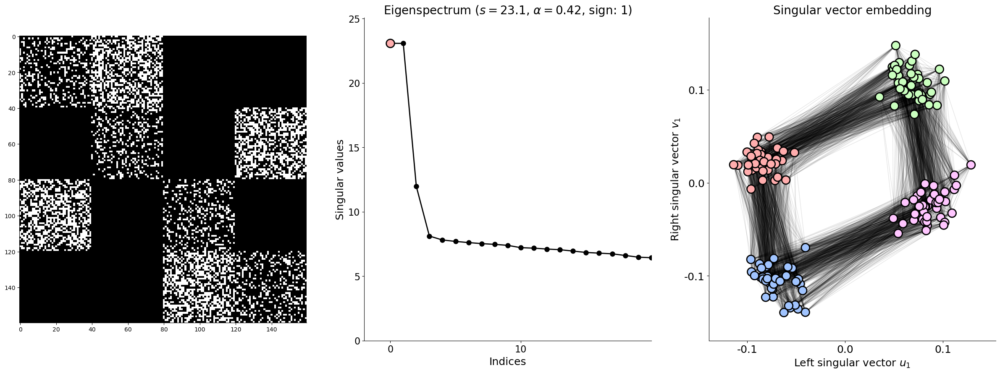

In [223]:
modmat = dgsp.modularity_matrix(graph, null_model="outin")

U, S, Vh = dgsp.sorted_SVD(modmat)
V = Vh.T

s_ideal = S.copy()
s_ideal = s_ideal/np.sum(graph)

n_nodes = graph.shape[0]

# Starting the plot
fig, all_axes = plt.subplots(nrows=1, ncols=3, figsize=(30, 10), gridspec_kw={"wspace": .2})

axes = all_axes

# Figure A (eigenvalues)

# Clear the 1st subplot (in the background)

axes[0].imshow(graph, cmap="binary_r", interpolation="none")

axes[1].plot(S, "o-", lw=2, color="k", markersize=8)

x_id = np.arange(n_nodes)[vector_id]
axes[1].scatter(x_id, S[vector_id], s=200, color=palette_rgb[0], edgecolors="k", lw=2, zorder=2)

# Figure B (singular vector embedding)
graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
labels = {i: "" for i in range(n_nodes)}

nx.draw_networkx_edges(nx.Graph(graph), pos=graph_pos, alpha=.1, ax=axes[2])
#nx.draw_networkx_edges(nx.DiGraph(graph), pos=graph_pos, alpha=.02, ax=axes[2])

colors = [palette_rgb[i//n_per_com] for i in np.arange(n_nodes)]

axes[2].scatter(U[:, vector_id], V[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

# Parameters A
cos_a = U[:, vector_id].T @ V[:, vector_id]
cos_a = np.sum(U[:, vector_id] * V[:, vector_id])
all_axes[1].set_title(f"Eigenspectrum ($s={S[vector_id]:1.1f}$, $\\alpha={cos_a:0.2f}$, sign: {np.sign(cos_a):1.0f})", fontsize=20*fontscale)

axes[1].set_xlim(-2, show_n_eig)
axes[1].set_ylim(0, S.max()+2)

n_ticks = show_n_eig // 2
axes[1].set_xticks(np.arange(0, show_n_eig, n_ticks))

for ax in axes[:2]:
    ax.spines[["top", "right"]].set_visible(False)

    #ax.set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
    #ax.set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16*fontscale)

all_axes[1].set_xlabel("Indices", fontsize=18*fontscale)
axes[1].set_ylabel("Singular values", fontsize=18*fontscale)

# Parameters B
axes[2].set_title("Singular vector embedding", fontsize=20*fontscale)
axes[2].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16*fontscale)
axes[2].spines[["top", "right"]].set_visible(False)

axes[2].set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
axes[2].set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

axes[2].set_xlabel(f"Left singular vector $u_{{{x_id+1}}}$", fontsize=18*fontscale)
axes[2].set_ylabel(f"Right singular vector $v_{{{x_id+1}}}$", fontsize=18*fontscale)

#fig.savefig(op.join(path_to_figures, f"Figure_01_EigenspectrumS{x_id+1}-v00.png"), dpi=600)

In [224]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# kmeans = KMeans(n_clusters=2, random_state=0, n_init="auto").fit(X)

def edge_bicommunities(adjacency, U, V, n_components, method="partition", n_kmeans=10) -> tuple:

    n_nodes = adjacency.shape[0]

    u_features = U[:, :n_components]
    v_features = V[:, :n_components]

    if method in ["partition", "sign"]:
        u_features = np.sign(u_features).astype(int)
        v_features = np.sign(v_features).astype(int)
    
    edge_out = np.array([u_features]*n_nodes).T
    edge_in = np.array([v_features]*n_nodes)
    edge_in = np.moveaxis(edge_in, -1, 0)

    # edge-based clustering
    edge_assignments = np.concatenate([edge_out, edge_in], axis=0)
    edge_assignments_vec = edge_assignments.reshape((2*n_components, -1)).T
    
    edge_assignments_vec = edge_assignments_vec[(graph != 0).reshape(-1)]

    if method in ["partition", "sign"]:
        clusters = np.unique(edge_assignments_vec, axis=0)
        n_clusters = clusters.shape[0]
        print(f"Found {n_clusters} clusters !")

        cluster2num = {tuple(c): i+1 for i, c in enumerate(clusters)}

        edge_clusters = np.array([cluster2num[tuple(c)] for c in edge_assignments_vec])

    else:
        if n_kmeans is None:
            n_kmeans = get_best_k(edge_assignments_vec)

        kmeans = KMeans(n_clusters=n_kmeans, random_state=0, n_init="auto").fit(edge_assignments_vec)
        edge_clusters = kmeans.labels_ + 1
        
        n_clusters = edge_clusters.max()
        print(f"Found {n_clusters} clusters !")

    edge_clusters_mat = np.zeros((n_nodes, n_nodes), dtype=int)
    edge_clusters_mat[graph != 0] = edge_clusters

    return edge_clusters, edge_clusters_mat


def get_best_k(X, max_k=10):
    print(f"Running silhouette analysis for k = 2 to {max_k} ...")
    n_clusters = np.arange(2, max_k)
    silhouette = np.zeros(n_clusters.shape[0])

    for i, n in enumerate(n_clusters):
        kmeans = KMeans(n_clusters=n, random_state=0, n_init="auto").fit(X)
        silhouette[i] = silhouette_score(X, kmeans.labels_)
    
    print(f"Best average silhouette_score is : {np.max(silhouette):1.2f} for K={n_clusters[np.argmax(silhouette)]}")
    return n_clusters[np.argmax(silhouette)]


def get_node_clusters(edge_clusters, edge_clusters_mat, method="probability", scale=True):
    n_nodes = edge_clusters_mat.shape[0]
    n_clusters = np.max(edge_clusters)

    if method == "probability":
        # Aggregate edges to nodes using cluster probability (number of edges)
        n_per_cluster = np.zeros((n_nodes, n_clusters))
        for cluster_id in np.arange(1, np.max(edge_clusters_mat)+1):
            n_per_cluster[:, cluster_id-1] = np.sum(edge_clusters_mat == cluster_id, axis=1)
            n_per_cluster[:, cluster_id-1] += np.sum(edge_clusters_mat == cluster_id, axis=1)

        cluster_prob = n_per_cluster/n_per_cluster.sum(axis=1)[:, None]
        cluster_maxprob = np.argmax(cluster_prob, axis=1)+1

        return cluster_maxprob, cluster_prob
    if "bimod" in method:
        sending_communities = np.zeros((n_clusters, n_nodes))
        receiving_communities = np.zeros((n_clusters, n_nodes))

        for cluster_id in np.arange(1, np.max(edge_clusters_mat)+1):
            sending_communities[cluster_id-1] = np.sum(edge_clusters_mat == cluster_id, axis=1)
            receiving_communities[cluster_id-1] = np.sum(edge_clusters_mat == cluster_id, axis=0)

        if scale:
            sending_communities /= np.sum(edge_clusters_mat > 0, axis=1)
            receiving_communities /= np.sum(edge_clusters_mat > 0, axis=1)

        return sending_communities, receiving_communities


def plot_bicommunity_lines(send_com, receive_com, axes=None):

    n_clusters = send_com.shape[0]
    
    cmap = plt.get_cmap("tab20")

    for i in np.arange(1,n_clusters+1):
        axes.plot(0.9*send_com[i-1].T+i, lw=2, color=cmap(i))
        axes.plot(0.9*receive_com[i-1].T+i, lw=2, ls="--", color=cmap(i))

    axes.set_yticks(np.arange(1, n_clusters+1)+0.4, labels=[f"$C_{{{i}}}$" for i in np.arange(1, n_clusters+1)], fontsize=15)
    axes.set_ylabel("Node cluster probabilities", fontsize=15)
    axes.set_xlabel("Nodes", fontsize=15)

    return axes

def plot_bicommunity(adjacency, send_com, receive_com, fig=None, axes=None, layout=None, **kwargs):
    if fig is None:
        fig, axes = plt.subplots(figsize=(10, 10))

    if isinstance(layout, dict):
        graph_pos = layout
    else:
        graph_pos = nx.spring_layout(nx.DiGraph(adjacency))

    node_pos = np.array(list(graph_pos.values())).T

    nx.draw_networkx_edges(nx.Graph(adjacency), pos=graph_pos, alpha=.05, ax=axes)

    is_in_none = np.logical_and(send_com == 0, receive_com == 0)
    is_in_both = np.logical_and(send_com > 0, receive_com > 0)
    send_only = np.logical_and(send_com > 0, receive_com == 0)
    receive_only = np.logical_and(send_com == 0, receive_com > 0)

    axes.scatter(node_pos[0, is_in_none], node_pos[1, is_in_none],
        s=50, c="tab:gray", edgecolor="k", linewidth=1, zorder=2
        )
    axes.scatter(node_pos[0, send_only], node_pos[1, send_only],
        s=80, c=send_com[send_only], cmap="RdBu", edgecolor="k", linewidth=1, zorder=2, vmin=-1, vmax=1
        #s=80, c=send_com[send_only], cmap="autumn", edgecolor="k", linewidth=1, zorder=2, vmin=0, vmax=1
        )
    axes.scatter(node_pos[0, receive_only], node_pos[1, receive_only],
        s=80, c=-receive_com[receive_only], cmap="RdBu", edgecolor="k", marker="s", linewidth=1, zorder=2, vmin=-1, vmax=1
        #s=80, c=receive_com[receive_only], cmap="winter", edgecolor="k", marker="s", linewidth=1, zorder=2, vmin=0, vmax=1
        )
    axes.scatter(node_pos[0, is_in_both], node_pos[1, is_in_both],
        s=100, c="w", edgecolor="k", marker="d", linewidth=1, zorder=2
        )

    return fig, axes


def plot_all_bicommunity(adjacency, send_com, receive_com, fig=None, axes=None, layout="embedding"):

    com_gs = GridSpecFromSubplotSpec(2, len(send_com)//2, subplot_spec=axes, wspace=0, hspace=0)
    com_axes = [fig.add_subplot(gs) for gs in com_gs]

    if layout == "embedding":
        U, _, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(adjacency))
        V = Vh.T

        graph_pos = {i: (U[i, 0], V[i, 0]) for i, _ in enumerate(adjacency)}
    else:
        graph_pos = nx.spring_layout(nx.DiGraph(adjacency))

    for i, (send, receive) in enumerate(zip(send_com, receive_com)):
        plot_bicommunity(adjacency, send, receive, fig=fig, axes=com_axes[i], layout=graph_pos)

    return fig, axes

Running silhouette analysis for k = 2 to 10 ...
Best average silhouette_score is : 0.66 for K=8
Found 8 clusters !


(<Figure size 2400x800 with 11 Axes>, <Axes: >)

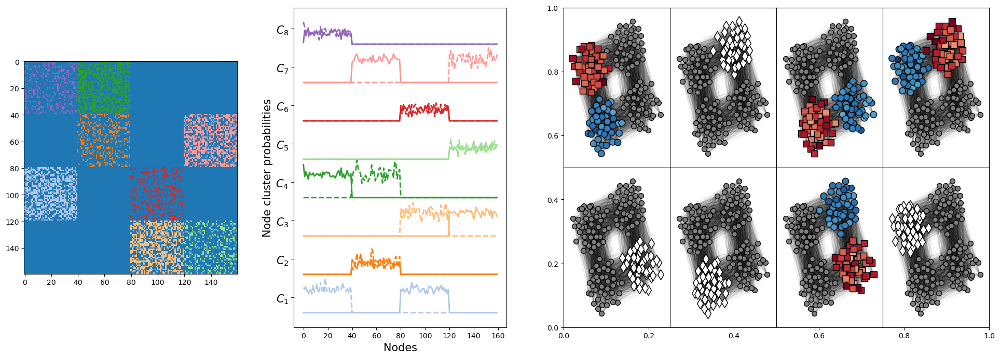

In [225]:
vector_id_max = 3

edge_clusters, edge_clusters_mat = edge_bicommunities(graph, U, V, vector_id_max, method="kmeans", n_kmeans=None)
n_clusters = np.max(edge_clusters)

sending_communities, receiving_communities = get_node_clusters(edge_clusters, edge_clusters_mat, method="bimodularity")

fig, axes = plt.subplots(ncols=3, figsize=(24, 8), gridspec_kw={"width_ratios": [1, 1, 2]})

# Edge colors
graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
labels = {i: "" for i in range(n_nodes)}

edge_list = nx.DiGraph(graph).edges()

axes[0].imshow(edge_clusters_mat, cmap="tab20", interpolation="none", vmin=0, vmax=20)

plot_bicommunity_lines(send_com=sending_communities, receive_com=receiving_communities, axes=axes[1])

plot_all_bicommunity(graph, sending_communities, receiving_communities, fig=fig, axes=axes[2], layout=None)

Found 4 clusters !


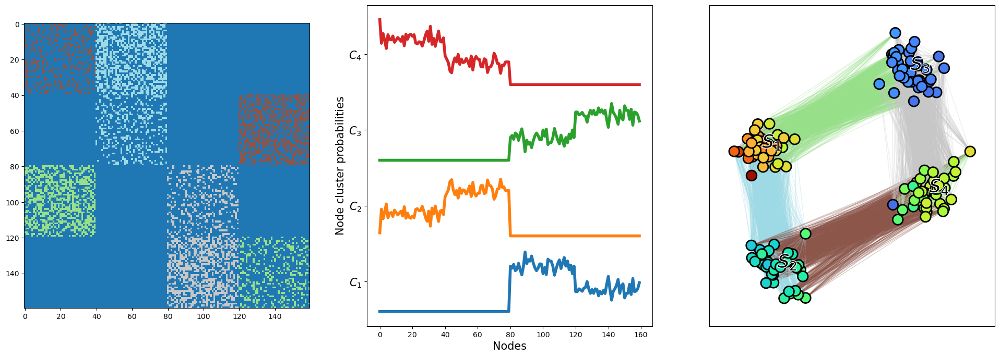

In [43]:
vector_id_max = 1

edge_clusters, edge_clusters_mat = edge_bicommunities(graph, U, V, vector_id_max, method="kmeans", n_kmeans=4)
n_clusters = np.max(edge_clusters)

cluster_maxprob, cluster_prob = get_node_clusters(edge_clusters, edge_clusters_mat, method="probability")
cluster_maxprob_value = np.max(cluster_prob, axis=1)

fig, axes = plt.subplots(ncols=3, figsize=(24, 8))

# Edge colors
graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
labels = {i: "" for i in range(n_nodes)}

edge_list = nx.DiGraph(graph).edges()

#axes[0].imshow(edge_clusters_mat, cmap="turbo", interpolation="none", vmin=0, vmax=n_clusters)
axes[0].imshow(edge_clusters_mat, cmap="tab20", interpolation="none", vmin=0, vmax=n_clusters)
#nx.draw_networkx_edges(nx.Graph(graph), pos=graph_pos, alpha=.3, ax=axes[0], edge_color=graph_edge_clusters, edge_cmap=plt.get_cmap("jet"), edgelist=edge_list)
#axes[0].scatter(U[:, vector_id], V[:, vector_id], s=200, color="silver", edgecolor="k", linewidth=2, zorder=2)

axes[1].plot(0.9*cluster_prob+np.arange(1,n_clusters+1), lw=4)
axes[1].set_yticks(np.arange(1, n_clusters+1)+0.4, labels=[f"$C_{{{i}}}$" for i in np.arange(1, n_clusters+1)], fontsize=15)
axes[1].set_ylabel("Node cluster probabilities", fontsize=15)
axes[1].set_xlabel("Nodes", fontsize=15)
#axes[1].plot(cluster_maxprob, lw=4)
#axes[1].plot(cluster_maxprob*cluster_maxprob_value)

nx.draw_networkx_edges(nx.Graph(graph), pos=graph_pos, alpha=.3, ax=axes[2], edge_color=edge_clusters, edge_cmap=plt.get_cmap("tab20"), edgelist=edge_list, edge_vmin=0, edge_vmax=n_clusters)
axes[2].scatter(U[:, vector_id], V[:, vector_id], s=200, c=cluster_maxprob*cluster_maxprob_value, edgecolor="k", linewidth=2, zorder=2, cmap="turbo", vmin=0, vmax=n_clusters)

for i, t in enumerate([f"$S_{{{i}}}$" for i in np.arange(1, n_clusters+1)]):
    x_mean = np.mean(U[n_per_com*i:n_per_com*(i+1), vector_id])
    y_mean = np.mean(V[n_per_com*i:n_per_com*(i+1), vector_id])
    axes[2].text(x_mean, y_mean, t, fontsize=25, color="k",
                 path_effects=[
                     withStroke(
                         linewidth=2,foreground="w",alpha=1
                         )])
    #axes[2].text(0.1, 0.9, t, fontsize=15, transform=axes[2].transAxes)

In [75]:
n_per_com = 40
density_value = .2
#density_value = 1
show_n_eig = 5.5
fontscale = 1

n_ideal_dir = 0
central_asymmetry = 0
vector_id = 0

within_community_multiplier = 1
#np.random.seed()
seed_one_one = 220367
seed_two_two = 1234

seed_use = seed_two_two
#seed_use = seed_one_one
graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value*within_community_multiplier,
                                      connect_density=[
                                          density_value, density_value, 0,
                                          0, density_value,
                                          density_value],
                                      #connect_density=[1, 1, 0, 1, 1, 1],
                                      connect_out_prob=[
                                          1-n_ideal_dir, 0+n_ideal_dir, 0.5-central_asymmetry,
                                          0.5+central_asymmetry, 1-n_ideal_dir,
                                          0+n_ideal_dir],
                                      seed=seed_use
                                      )

#for i in range(4):
#    graph[i*n_per_com:(i+1)*n_per_com][:, i*n_per_com:(i+1)*n_per_com] += graph[i*n_per_com:(i+1)*n_per_com][:, i*n_per_com:(i+1)*n_per_com].T
for i in [1, 2]:
    graph[i*n_per_com:(i+1)*n_per_com][:, i*n_per_com:(i+1)*n_per_com] = 0

#graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
#                                      connect_density=[density_value, density_value, density_value,
#                                                       density_value, density_value,
#                                                       density_value],
#                                      #connect_density=[1, 1, 0, 1, 1, 1],
#                                      connect_out_prob=[1, 0, 0.5, 0.5, 1, 0], seed=1234)

#graph += graph.T
vector_id = 0

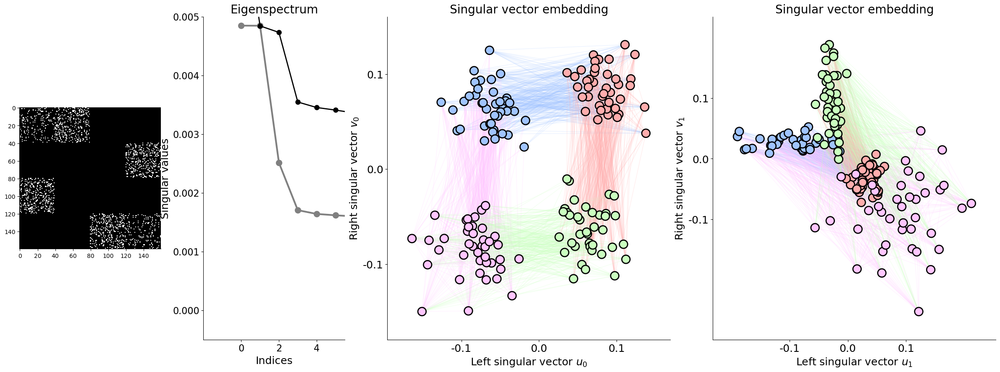

In [76]:
#n_break = 100
#row_break_id = np.random.choice(np.arange(40), n_break)
#col_break_id = np.random.choice(120+np.arange(40), n_break)
#graph[row_break_id, col_break_id] = 1

# Building the modularity matrix
modmat = dgsp.modularity_matrix(graph, null_model="outin")

U, S, Vh = dgsp.sorted_SVD(modmat, fix_negative=False)
V = Vh.T

n_nodes = graph.shape[0]

# Starting the plot
fig, all_axes = plt.subplots(nrows=1, ncols=4, figsize=(30, 10), gridspec_kw={"wspace": .2, "width_ratios":[0.5, 0.5, 1, 1]})

axes = all_axes

# Figure A (eigenvalues)

# Clear the 1st subplot (in the background)

axes[0].imshow(graph, cmap="binary_r", interpolation="none")

s_scaled = S/np.sum(graph)
for s_i, s_plot in enumerate([s_ideal, s_scaled]):
    if s_i > 0:
        axes[1].plot(s_plot, "o-", lw=2, color="k", markersize=8)
        #x_id = np.arange(n_nodes)[vector_id]
        #sign_id = (1 + np.sign(s_plot[vector_id]))//2
        #print(sign_id)
        #axes[1].scatter(x_id, s_plot[vector_id], s=200, color=palette_rgb[1-sign_id.astype(int)], edgecolors="k", lw=2, zorder=2)
    else:
        axes[1].plot(s_plot, "o-", lw=3, color="gray", markersize=10)

for vector_id in [0, 1]:
    # Figure B (singular vector embedding)
    graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
    labels = {i: "" for i in range(n_nodes)}

    nx_graph = nx.DiGraph(graph)

    edge_list = list(nx_graph.edges())
    edge_colors = [palette_rgb[i] for i in np.array(nx_graph.edges())[:, 1]//n_per_com]

    nx.draw_networkx_edges(nx.Graph(graph), pos=graph_pos, alpha=.2, ax=axes[2+vector_id], edge_color=edge_colors, edgelist=edge_list)
    #nx.draw_networkx_edges(nx.DiGraph(graph), pos=graph_pos, alpha=.02, ax=axes[2])

    colors = [palette_rgb[i//n_per_com] for i in np.arange(n_nodes)]

    axes[2+vector_id].scatter(U[:, vector_id], V[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

# Parameters A
all_axes[1].set_title("Eigenspectrum", fontsize=20*fontscale)

axes[1].set_xlim(-2, show_n_eig)
#axes[1].set_ylim(0, s_ideal.max()+2)
axes[1].set_ylim(-5e-4, 0.005)

n_ticks = show_n_eig // 2
axes[1].set_xticks(np.arange(0, show_n_eig, n_ticks))

for ax in axes[:2]:
    ax.spines[["top", "right"]].set_visible(False)

    #ax.set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
    #ax.set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16*fontscale)

all_axes[1].set_xlabel("Indices", fontsize=18*fontscale)
axes[1].set_ylabel("Singular values", fontsize=18*fontscale)

# Parameters B
for i in [0, 1]:
    axes[2 + i].set_title("Singular vector embedding", fontsize=20*fontscale)
    axes[2 + i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16*fontscale)
    axes[2 + i].spines[["top", "right"]].set_visible(False)

    axes[2 + i].set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
    axes[2 + i].set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

    axes[2 + i].set_xlabel(f"Left singular vector $u_{{{i}}}$", fontsize=18*fontscale)
    axes[2 + i].set_ylabel(f"Right singular vector $v_{{{i}}}$", fontsize=18*fontscale)

#fig.savefig(op.join(path_to_figures, f"Figure_01_EigenspectrumS{x_id+1}-v00.png"), dpi=600)

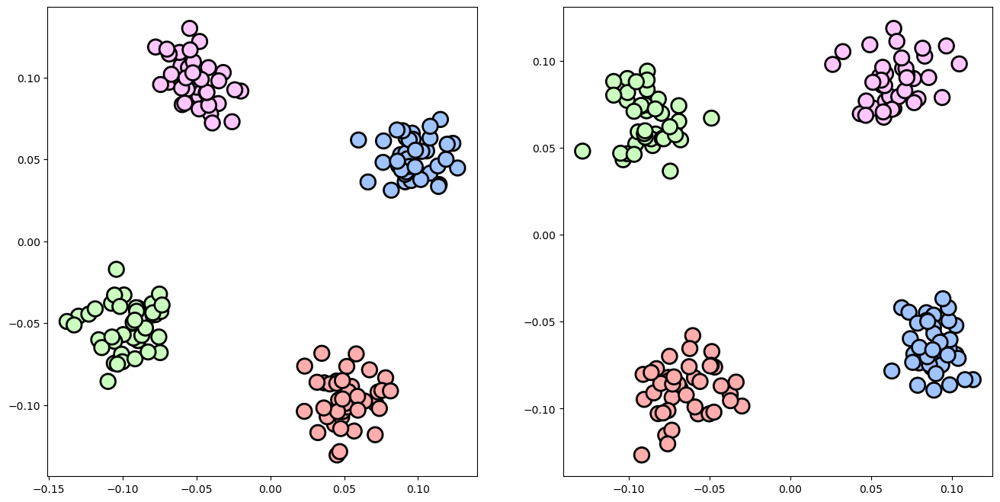

In [257]:
fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

axes[0].scatter(U[:, 0], U[:, 1], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)
axes[1].scatter(V[:, 0], V[:, 1], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

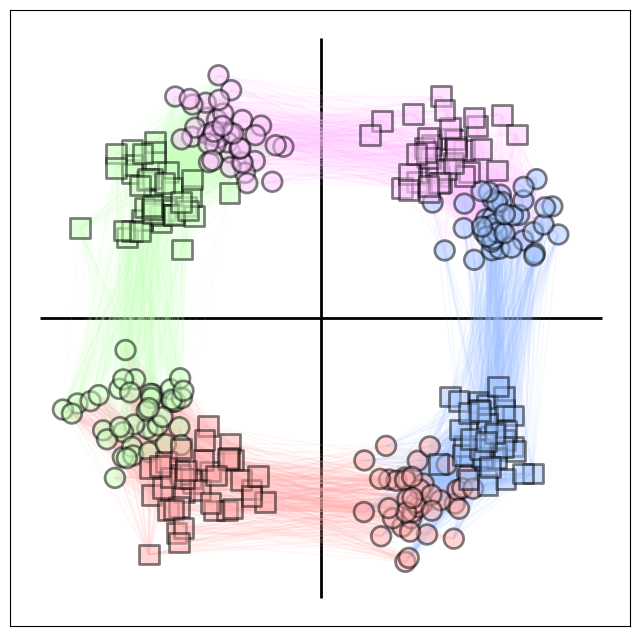

In [258]:
fig, axes = plt.subplots(figsize=(8, 8))

second_id = 1

axes.scatter(U[:, 0], U[:, second_id], s=200, color=colors, marker="o", edgecolor="k", linewidth=2, zorder=2, alpha=0.5)
axes.scatter(V[:, 0], V[:, second_id], s=200, color=colors, marker="s", edgecolor="k", linewidth=2, zorder=2, alpha=0.5)


# Figure B (singular vector embedding)
graph_pos = {i: (U[i, 0], U[i, second_id]) for i in range(n_nodes)}
graph_pos.update({i+n_nodes: (V[i, 0], V[i, second_id]) for i in range(n_nodes)})

graph_bipartite = np.zeros((2*n_nodes, 2*n_nodes))
graph_bipartite[:n_nodes][:, n_nodes:] = graph

nx_graph = nx.DiGraph(graph_bipartite)

edge_list = list(nx_graph.edges())
edge_colors = [palette_rgb[i] for i in (np.array(nx_graph.edges())[:, 1]-n_nodes)//n_per_com]

nx.draw_networkx_edges(nx.Graph(graph_bipartite), pos=graph_pos, alpha=.1, ax=axes, edge_color=edge_colors, edgelist=edge_list)
#nx.draw_networkx_edges(nx.Graph(graph_bipartite), pos=graph_pos, alpha=.02, ax=axes)

axes.hlines(0, -.15, .15, color="k", alpha=1, lw=2, zorder=0)
axes.vlines(0, -.15, .15, color="k", alpha=1, lw=2, zorder=0)

# Going stochastic

Text(0.5, 0.98, 'Singular vector embedding (3 trials)')

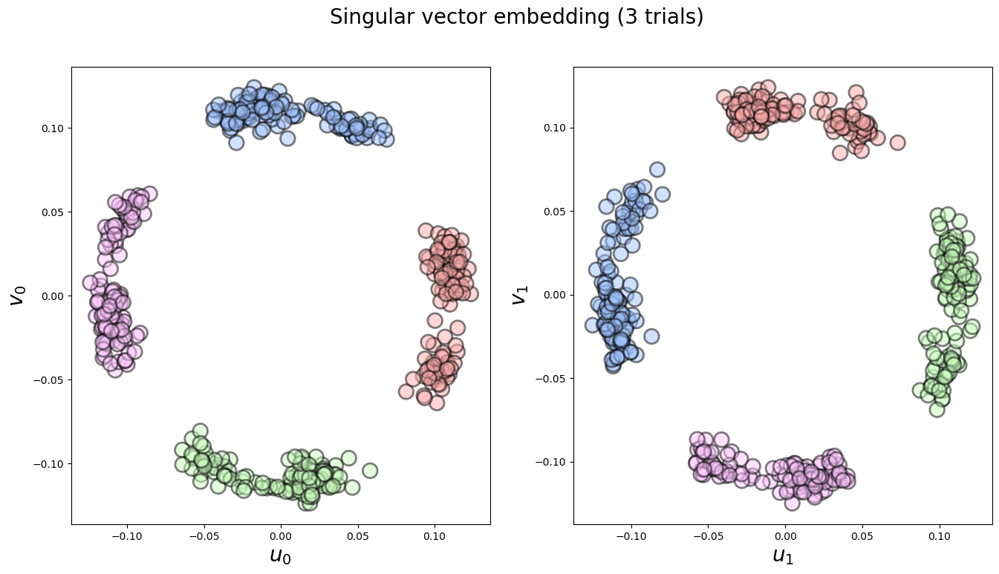

In [341]:
n_trials = 3

density_value = .9

fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

if n_trials == 2:
    seeds = [4321, 2405]
    markers = ["o", "s"]
else:
    markers = ["o"] * n_trials
    seeds = [None] * n_trials

all_Us = []
all_Vs = []
for trial_i in range(n_trials):
    np.random.seed(seed=seeds[trial_i])
    graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value*within_community_multiplier,
                                        connect_density=[
                                            density_value, density_value, density_value,
                                            density_value, density_value,
                                            density_value],
                                        #connect_density=[1, 1, 0, 1, 1, 1],
                                        connect_out_prob=[
                                            1-n_ideal_dir, 0+n_ideal_dir, 0.5-central_asymmetry,
                                            0.5+central_asymmetry, 1-n_ideal_dir,
                                            0+n_ideal_dir])
    
    U, S, Vh = dgsp.sorted_SVD(dgsp.modularity_matrix(graph, null_model="outin"))
    V = Vh.T

    sign_thresh = 1e-2
    if (U[:n_per_com, 0].mean() < sign_thresh) or (V[:n_per_com, 0].mean() < sign_thresh):
        U[:, 0] = -U[:, 0]
        V[:, 0] = -V[:, 0]
    #if U[:n_per_com, 1].mean() < sign_thresh:
    if (U[:n_per_com, 1].mean() < sign_thresh) or (V[:n_per_com, 1].mean() < sign_thresh):
        U[:, 1] = -U[:, 1]
        V[:, 1] = -V[:, 1]

    U_plot = U[:, :2].copy()
    V_plot = V[:, :2].copy()

    if trial_i == 0:
        all_Us = U[:, :2].copy()
        all_Vs = V[:, :2].copy()
        first_U = U[:, :2].copy()
        first_V = V[:, :2].copy()
        first_concat = np.concatenate([U[:, :2], V[:, :2]], axis=0)
    else:
        all_Us = np.concatenate([all_Us, U[:, :2]], axis=1)
        all_Vs = np.concatenate([all_Vs, V[:, :2]], axis=1)
        #if np.abs(np.mean((U[:, 0] - first_U[:, 1])**2) - np.mean((U[:, 0] - first_U[:, 0])**2)) > 1e-2:
        #if np.abs(np.mean((U[:, 0] - first_U[:, 1])**2) - np.mean((U[:, 0] - first_U[:, 0])**2)) > 1e-2:
        concat = np.concatenate([U[:, :2], V[:, :2]], axis=0)

        #if np.mean((U[:, 0] - first_U[:, 1])**2) < np.mean((U[:, 0] - first_U[:, 0])**2):
        if np.mean((U[:, 0] - first_U[:, 1])**2) < np.mean((U[:, 0] - first_U[:, 0])**2):
            U_plot = U[:, [1, 0]].copy()
            V_plot = V[:, [1, 0]].copy()

    for i in range(2):
        axes[i].scatter(U_plot[:, i], V_plot[:, i], s=200, color=colors, edgecolor="k", marker=markers[trial_i], linewidth=2, zorder=2, alpha=0.5)
        #axes[i].scatter(U[:, i], V[:, i], s=100, color=colors, edgecolor="none", zorder=2, alpha=0.5)
        axes[i].set_xlabel(f"$u_{{{i}}}$", fontsize=20)
        axes[i].set_ylabel(f"$v_{{{i}}}$", fontsize=20)

fig.suptitle(f"Singular vector embedding ({n_trials} trials)", fontsize=20)

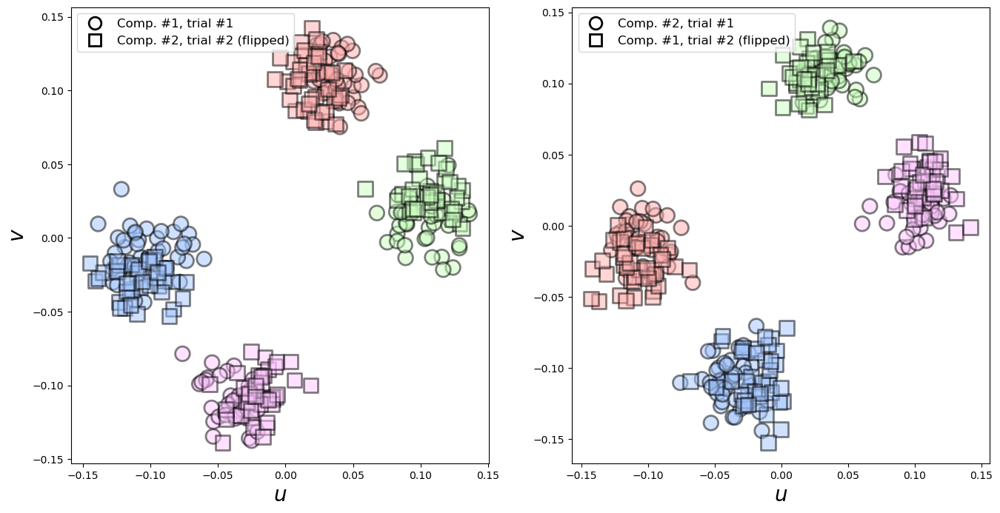

In [328]:
from matplotlib.lines import Line2D

fig, axes = plt.subplots(ncols=2, figsize=(16, 8))

indices = [[0, 3], [1, 2]]
labels = [["Comp. #1, trial #1", "Comp. #2, trial #2 (flipped)"],
          ["Comp. #2, trial #1", "Comp. #1, trial #2 (flipped)"]]
for j, idx in enumerate(indices):
    k=0
    for single_U, single_V in zip(all_Us.T[idx], all_Vs.T[idx]):

        sign = 1
        mark = "o"
        if k > 0:
            sign = -1
            mark = "s"
        
        axes[j].scatter(sign*single_U, sign*single_V, color=colors, edgecolors="k", marker=mark, lw=2, s=200, zorder=2, alpha=0.5)

        k += 1

    axes[j].set_xlabel(f"$u$", fontsize=20)
    axes[j].set_ylabel(f"$v$", fontsize=20)

    legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=12, markeredgecolor="k",
                            markeredgewidth=2, marker=markers[i], label=lab) for i, lab in enumerate(labels[j])]

    axes[j].legend(handles=legend_elements, fontsize=12)

# Stochastic detection

# Comparisons with symmetric verions

Figure size has been set to (20, 14)


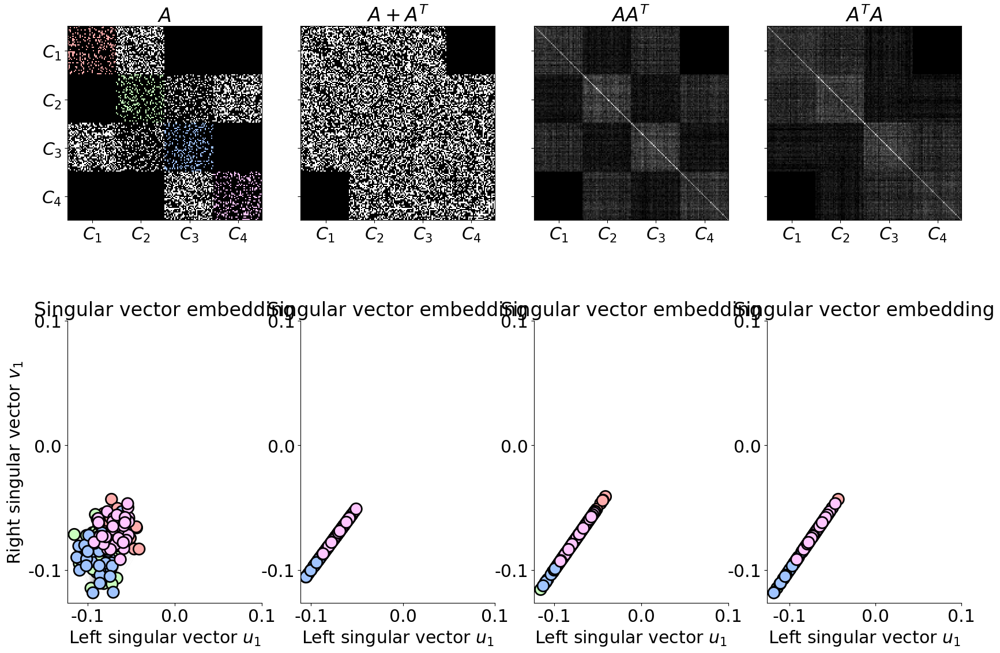

In [5]:
from matplotlib.colors import to_rgb, ListedColormap

use_real_size = False
figsize = (20, 14)
fontscale = 1.2

colorpalette = ["#FFADAD", "#CAFFBF", "#A0C4FF", "#FFC6FF"]
palette_rgb = [to_rgb(color) for color in colorpalette]

custom_cmap = ListedColormap([(0, 0, 0), (1, 1, 1)] + palette_rgb)

n_per_com = 40
density_value = .4

# Building the graph
graph = dgsp_graphs.toy_n_communities(n_per_com, 4, com_density=density_value,
                                    connect_density=[density_value, density_value, 0, 
                                                    density_value, density_value, density_value],
                                    #connect_density=[1, 1, 0, 1, 1, 1],
                                    connect_out_prob=[1, 0, 0, 0.5, 1, 0], seed=1234)

all_matrices = [graph, graph + graph.T, graph @ graph.T, graph.T @ graph]
all_titles = ["$A$", "$A+A^T$", "$AA^T$", "$A^TA$"]

if use_real_size:
    size_cm = 17.8
    figsize = (size_cm * cm_to_inch, size_cm * cm_to_inch)

print(f"Figure size has been set to {figsize}")

fig, axes = plt.subplots(nrows=2, ncols=4, figsize=figsize, gridspec_kw={"wspace": .2, "hspace":.2}, sharey="row")

for ax_id, (ax, matrix, title) in enumerate(zip(axes.T, all_matrices, all_titles)):
    # Figure B
    plot_adj = matrix.copy()

    if ax_id == 0:
        for i in range(4):
            plot_adj[i*n_per_com:(i+1)*n_per_com, i*n_per_com:(i+1)*n_per_com] = matrix[i*n_per_com:(i+1)*n_per_com, i*n_per_com:(i+1)*n_per_com] * (i+2)

        ax[0].imshow(plot_adj, cmap=custom_cmap, interpolation="none")
    else:
        ax[0].imshow(plot_adj, cmap="binary_r", interpolation="none")


    # Building the modularity matrix
    modmat = dgsp.modularity_matrix(matrix, null_model="outin")
    modmat = matrix

    U, S, Vh = dgsp.sorted_SVD(modmat)
    V = Vh.T

    vector_id = 0
    n_nodes = matrix.shape[0]

    graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
    labels = {i: "" for i in range(n_nodes)}

    edge_alpha = 0.02
    if ax_id > 0:
        edge_alpha = 0.002
    #nx.draw_networkx_edges(nx.DiGraph(matrix - np.diag(np.diag(matrix))), pos=graph_pos, alpha=edge_alpha, ax=ax[1], connectionstyle="arc3,rad=0.4")
    nx.draw_networkx_edges(nx.Graph(matrix - np.diag(np.diag(matrix))), pos=graph_pos, alpha=edge_alpha, ax=ax[1])

    colors = [palette_rgb[i//n_per_com] for i in np.arange(n_nodes)]

    ax[1].scatter(U[:, vector_id], V[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

    #axes[2].scatter(U[:, vector_id], V[:, vector_id], s=200, color="w", edgecolor="k", linewidth=2, zorder=2)

    # Parameters B
    ax[0].set_title(title, fontsize=20*fontscale)

    ax[0].set_xticks(np.arange(20, 141, 40), labels=["$C_1$", "$C_2$", "$C_3$", "$C_4$"], fontsize=18*fontscale)
    ax[0].set_yticks(np.arange(20, 141, 40), labels=["$C_1$", "$C_2$", "$C_3$", "$C_4$"], fontsize=18*fontscale)

    # Parameters C
    ax[1].set_title("Singular vector embedding", fontsize=20*fontscale)
    ax[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
    ax[1].spines[["top", "right"]].set_visible(False)

    ax[1].set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
    ax[1].set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

    ax[1].set_xlabel("Left singular vector $u_1$", fontsize=18*fontscale)

    if ax_id == 0:
        ax[1].set_ylabel("Right singular vector $v_1$", fontsize=18*fontscale)
        #ax[1].set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

#fig.savefig(op.join(path_to_figures, "Figure_01_SymmComp-v00.png"), dpi=600)

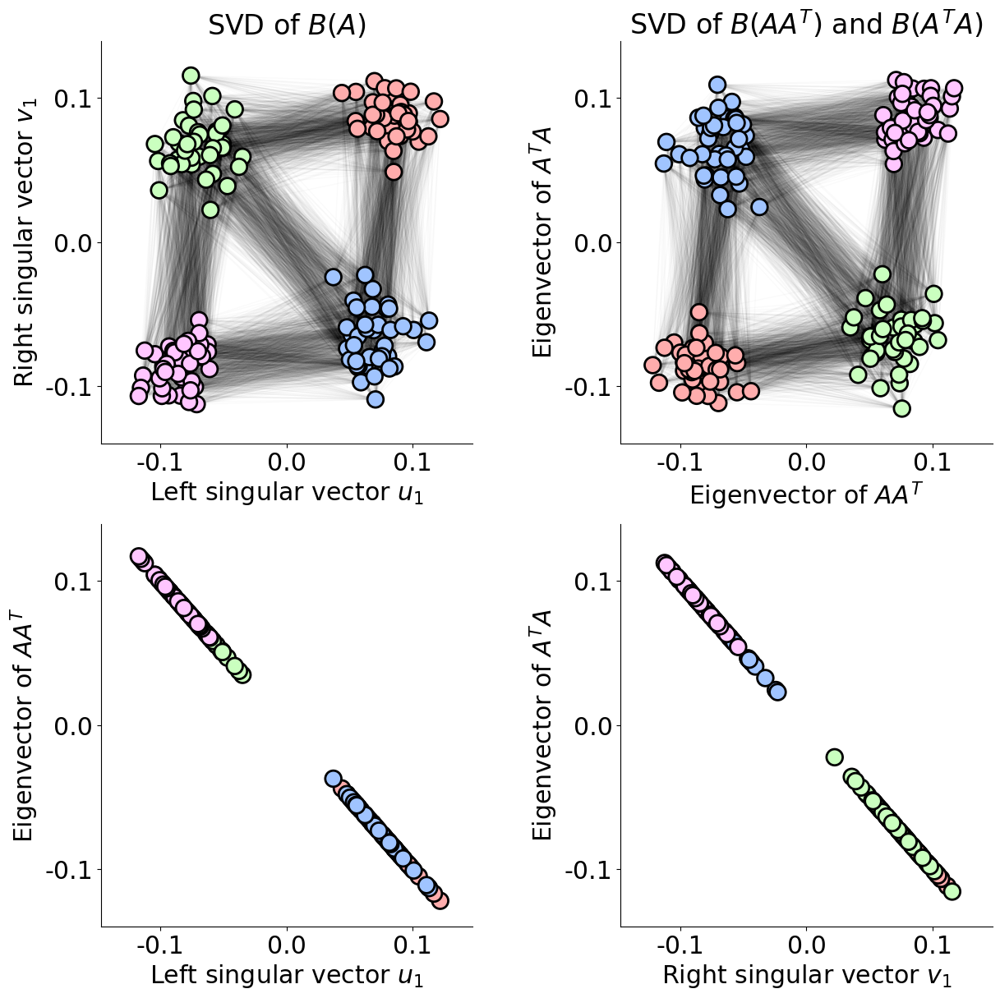

In [11]:
# Building the modularity matrix
modmat = dgsp.modularity_matrix(graph, null_model="outin")

U, S, Vh = dgsp.sorted_SVD(modmat)
V = Vh.T

vector_id = 0
n_nodes = graph.shape[0]

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(14, 14), gridspec_kw={"wspace": .4, "hspace":.2}, sharey=True, sharex=True)

graph_pos = {i: (U[i, vector_id], V[i, vector_id]) for i in range(n_nodes)}
labels = {i: "" for i in range(n_nodes)}

edge_alpha = 0.02
nx.draw_networkx_edges(nx.Graph(matrix - np.diag(np.diag(matrix))), pos=graph_pos, alpha=edge_alpha, ax=ax[0, 0])

colors = [palette_rgb[i//n_per_com] for i in np.arange(n_nodes)]

ax[0, 0].scatter(U[:, vector_id], V[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

# Second plot
modmat = dgsp.modularity_matrix(graph @ graph.T, null_model="outin")

U_aat, S, Vh = dgsp.sorted_SVD(modmat)
V_aat = Vh.T

modmat = dgsp.modularity_matrix(graph.T @ graph, null_model="outin")

U_ata, S, Vh = dgsp.sorted_SVD(modmat)
V_ata = Vh.T

graph_pos = {i: (U_aat[i, vector_id], V_ata[i, vector_id]) for i in range(n_nodes)}
labels = {i: "" for i in range(n_nodes)}
edge_alpha = 0.02
nx.draw_networkx_edges(nx.Graph(matrix - np.diag(np.diag(matrix))), pos=graph_pos, alpha=edge_alpha, ax=ax[0, 1])

colors = [palette_rgb[i//n_per_com] for i in np.arange(n_nodes)]

ax[0, 1].scatter(U_aat[:, vector_id], V_ata[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

ax[1, 0].scatter(U[:, vector_id], U_aat[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)
ax[1, 1].scatter(V[:, vector_id], V_ata[:, vector_id], s=200, color=colors, edgecolor="k", linewidth=2, zorder=2)

# Parameters C
for a in ax[0]:
    a.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
    a.spines[["top", "right"]].set_visible(False)
    a.set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
    a.set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

ax[0, 0].set_title("SVD of $B(A)$", fontsize=20*fontscale)
ax[0, 0].set_xlabel("Left singular vector $u_1$", fontsize=18*fontscale)
ax[0, 0].set_ylabel("Right singular vector $v_1$", fontsize=18*fontscale)

ax[0, 1].set_title("SVD of $B(AA^T)$ and $B(A^TA)$", fontsize=20*fontscale)
ax[0, 1].set_xlabel("Eigenvector of $AA^T$", fontsize=18*fontscale)
ax[0, 1].set_ylabel("Eigenvector of $A^TA$", fontsize=18*fontscale)

for a in ax[1]:
    a.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
    a.spines[["top", "right"]].set_visible(False)
    a.set_xticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)
    a.set_yticks(np.linspace(-.1, .1, 3), labels=np.linspace(-.1, .1, 3), fontsize=18*fontscale)

ax[1, 0].set_xlabel("Left singular vector $u_1$", fontsize=18*fontscale)
ax[1, 0].set_ylabel("Eigenvector of $AA^T$", fontsize=18*fontscale)

ax[1, 1].set_xlabel("Right singular vector $v_1$", fontsize=18*fontscale)
ax[1, 1].set_ylabel("Eigenvector of $A^TA$", fontsize=18*fontscale)

fig.savefig(op.join(path_to_figures, f"Figure_01_SVDCompCorr-v00.png"), dpi=600)

# Detection of bicommunities (Figure 2)

# C. Elegans example (Figure 3)

In [5]:
path_to_adj = "data/SI 5 Connectome adjacency matrices, corrected July 2020.xlsx"
neuron_adj_df = pd.ExcelFile(path_to_adj)
print("Sheet names are:", neuron_adj_df.sheet_names)

chem_df = neuron_adj_df.parse("hermaphrodite chemical")

# Getting neuron informations
# Dropping Nans
neuron_def_df = chem_df.iloc[:, :3].dropna(how="all").ffill()
neuron_def_df.columns = ["Type", "Detail", "Neuron"]
# Dropping Pharynx neurons
neuron_def_df = neuron_def_df[neuron_def_df.Type != "PHARYNX"].reset_index(drop=True)

lab_to_id = {lab: i for i, lab in enumerate(neuron_def_df["Neuron"].values)}

# Adding landmark information (average position on antero-posterior axis)
path_to_neurons_types = "data/NeuronFixedPoints.xls"
neuron_AvgLandmarkPos = pd.read_excel(path_to_neurons_types).groupby("Neuron")["Landmark Position"].mean()

neuron_def_df = neuron_def_df.merge(neuron_AvgLandmarkPos, on="Neuron", how="left")

# Order Neurons by Type and Landmark Position
#neuron_def_df = neuron_def_df.sort_values(["Type", "Landmark Position"])

type_to_num = {t: i for i, t in enumerate(neuron_def_df["Type"].unique())}
neuron_def_df["Type_num"] = [type_to_num[t] for t in neuron_def_df["Type"]]

all_labels = neuron_def_df["Neuron"].values.tolist()
print(f"There are {len(all_labels)} neurons in the dataset")

fixed_details = [lab.replace(" MOTOR NEURONS", "") if "MOTOR NEURONS" in str(lab) else lab for lab in neuron_def_df.loc[:, "Detail"]]
neuron_def_df.loc[:, "Detail"] = fixed_details

neuron_def_df["Type_long"] = neuron_def_df["Type"]+"_"+neuron_def_df["Detail"].astype(str)

type_long_to_num = {t: i for i, t in enumerate(neuron_def_df["Type_long"].unique())}
neuron_def_df["TypeLong_num"] = [type_long_to_num[t] for t in neuron_def_df["Type_long"]]

print(neuron_def_df.loc[:, "Type_long"].unique())
neuron_def_df

Sheet names are: ['TITLE AND LEGEND', 'hermaphrodite chemical', 'hermaphrodite gap jn asymmetric', 'hermaphrodite gap jn symmetric', 'male chemical', 'male gap jn asymmetric', 'male gap jn symmetric']
There are 280 neurons in the dataset
['SENSORY NEURONS_6' 'SENSORY NEURONS_5' 'SENSORY NEURONS_4'
 'SENSORY NEURONS_3' 'SENSORY NEURONS_2' 'SENSORY NEURONS_1'
 'INTERNEURONS_4' 'INTERNEURONS_3' 'INTERNEURONS_2' 'INTERNEURONS_1'
 'MOTOR NEURONS_HEAD' 'MOTOR NEURONS_SUBLATERAL'
 'MOTOR NEURONS_VENTRAL CORD' 'SEX SPECIFIC_VENTRAL CORD']


,Type,Detail,Neuron,Landmark Position,Type_num,Type_long,TypeLong_num
0,SENSORY NEURONS,6,ASIL,0.00,0,SENSORY NEURONS_6,0
1,SENSORY NEURONS,6,ASIR,0.00,0,SENSORY NEURONS_6,0
2,SENSORY NEURONS,6,ASJL,0.00,0,SENSORY NEURONS_6,0
3,SENSORY NEURONS,6,ASJR,0.00,0,SENSORY NEURONS_6,0
4,SENSORY NEURONS,6,AWAL,0.01,0,SENSORY NEURONS_6,0
...,...,...,...,...,...,...,...
275,SEX SPECIFIC,VENTRAL CORD,VC02,0.54,3,SEX SPECIFIC_VENTRAL CORD,13
276,SEX SPECIFIC,VENTRAL CORD,VC03,0.54,3,SEX SPECIFIC_VENTRAL CORD,13
277,SEX SPECIFIC,VENTRAL CORD,VC04,0.54,3,SEX SPECIFIC_VENTRAL CORD,13
278,SEX SPECIFIC,VENTRAL CORD,VC05,0.54,3,SEX SPECIFIC_VENTRAL CORD,13


In [6]:
path_to_bullmore = "data/celegans-bullmore"
bullmore_file = "Worm279dir.mat"

no_sex = True
gap_junc = False

from scipy.io import loadmat
import os.path as op

bullmore_dict = loadmat(op.join(path_to_bullmore, bullmore_file))

print(bullmore_dict.keys())

bullmore_adj_sum = bullmore_dict["Worm279_matrix_dir"]
bullmore_adj_gap = bullmore_dict["Worm279_ejunct_matrix_dir"]
bullmore_adj_chem = bullmore_dict["Worm279_synapse_matrix_dir"]

bullmore_label = np.array([lab[0][0] for lab in bullmore_dict["Worm279_labels"]])
bullmore_type = [neuron_def_df[neuron_def_df["Neuron"] == lab]["Type"].values[0] for lab in bullmore_label]
bullmore_type_num = [neuron_def_df[neuron_def_df["Neuron"] == lab]["Type_num"].values[0] for lab in bullmore_label]
bullmore_landmark = [neuron_def_df[neuron_def_df["Neuron"] == lab]["Landmark Position"].values[0] for lab in bullmore_label]

bullmore_pos = bullmore_dict["Worm279_positions"]

# REMOVE SEX SPECIFIC NEURONS
if no_sex:
    no_sex_spec = np.array(bullmore_type_num, dtype=int) < 3
    bullmore_type = np.array(bullmore_type)[no_sex_spec]
    bullmore_type_num = np.array(bullmore_type_num)[no_sex_spec]
    bullmore_label = np.array(bullmore_label)[no_sex_spec]
    bullmore_pos = np.array(bullmore_pos)[no_sex_spec]
    bullmore_adj_gap = np.array(bullmore_adj_gap)[no_sex_spec][:, no_sex_spec]
    bullmore_adj_chem = np.array(bullmore_adj_chem)[no_sex_spec][:, no_sex_spec]

bullmore_to_label = [lab_to_id[lab] for lab in bullmore_label]
label_to_bullmore = np.argsort(bullmore_to_label)

gap_adj_bull = bullmore_adj_gap[bullmore_to_label][:, bullmore_to_label]
chem_adj_bull = bullmore_adj_chem[bullmore_to_label][:, bullmore_to_label]

chen_adj = bullmore_dict["Worm279_matrix"]
whole_adj_chen = chen_adj[bullmore_to_label][:, bullmore_to_label]

bullmore_label_cleaned = bullmore_label[label_to_bullmore]

dict_keys(['__header__', '__version__', '__globals__', 'Worm279_birthtime', 'Worm279_labels', 'Worm279_positions', 'Worm279_elist_connectiontype', 'Worm279_elist_connectionstrength', 'Worm279_Wmatrix', 'Worm279_matrix', 'Worm279_synapse_matrix_dir', 'Worm279_ejunct_matrix_dir', 'Worm279_matrix_dir'])


Asymmetric wiring matrix has shape (272, 272)
k_out 0 49
k_in 0 53
mean of V^T U: -0.06503847524128842


Text(0.5, 1.0, 'Eigenvectors (2 smallest non zero)')

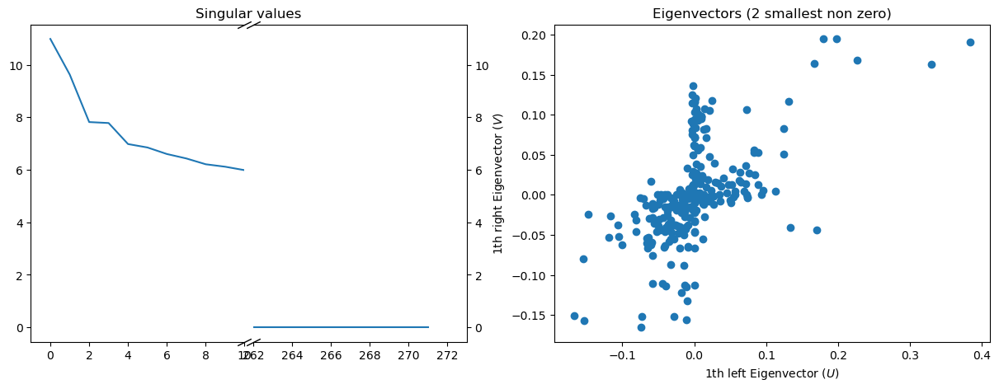

In [7]:
thresh = 0
if gap_junc:
    wiring_adj = bullmore_adj_gap+bullmore_adj_chem
else:
    wiring_adj = bullmore_adj_chem
wiring_adj -= np.diag(np.diag(wiring_adj))
wiring_sym = (wiring_adj > thresh).astype(int)
#wiring_sym = (wiring_adj).astype(int)
wiring_mod = dgsp.modularity_matrix(wiring_sym, null_model="outin")
print(f"Asymmetric wiring matrix has shape {wiring_sym.shape}")

nodes_labels = bullmore_label

d_mat = np.diag(wiring_sym.sum(axis=1))
print("k_out", wiring_sym.sum(axis=1).min(), wiring_sym.sum(axis=1).max())
print("k_in", wiring_sym.sum(axis=0).min(), wiring_sym.sum(axis=0).max())

#U, S, Vh = svd(wiring_mod)
#U, S, Vh = dgsp.sorted_SVD(wiring_mod)
U, S, Vh = dgsp.sorted_SVD(wiring_mod, fix_negative=False)
V = Vh.T

print("mean of V^T U:", np.diag(Vh@U).mean())

sort_idx = np.flip(np.argsort(S))
S = S[sort_idx]
U = U[:, sort_idx]
V = V[:, sort_idx]

show_n_eig = 10

fig, all_axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

gs1 = GridSpecFromSubplotSpec(1, 2, subplot_spec=all_axes[0], wspace=.04)

axes = [fig.add_subplot(gs1[0]), fig.add_subplot(gs1[1]), fig.add_subplot(all_axes[1])]

# Clear the 1st subplot (in the background)
all_axes[0].set_title("Singular values")
all_axes[0].set_xticks([])
all_axes[0].set_yticks([])
for loc, s in all_axes[0].spines.items():
    s.set_visible(False)

axes[0].plot(S)
axes[1].plot(S)

axes[0].set_xlim(-1, show_n_eig)
axes[1].set_xlim(len(S)-show_n_eig, len(S)+1)

axes[0].spines.right.set_visible(False)
axes[1].spines.left.set_visible(False)

axes[1].yaxis.tick_right()

# From matplotlib examples
d = .5  # proportion of vertical to horizontal extent of the slanted line
kwargs = dict(marker=[(-1, -d), (1, d)], markersize=12,
              linestyle="none", color='k', mec='k', mew=1, clip_on=False)
axes[0].plot([1, 1], [1, 0], transform=axes[0].transAxes, **kwargs)
axes[1].plot([0, 0], [0, 1], transform=axes[1].transAxes, **kwargs)

eig_id = np.where(S > 1e-5)[0][0]

axes[2].scatter(U[:, eig_id], V[:, eig_id])
axes[2].set_xlabel(f"{eig_id + 1}th left Eigenvector ($U$)")
axes[2].set_ylabel(f"{eig_id + 1}th right Eigenvector ($V$)")
axes[2].set_title("Eigenvectors (2 smallest non zero)")

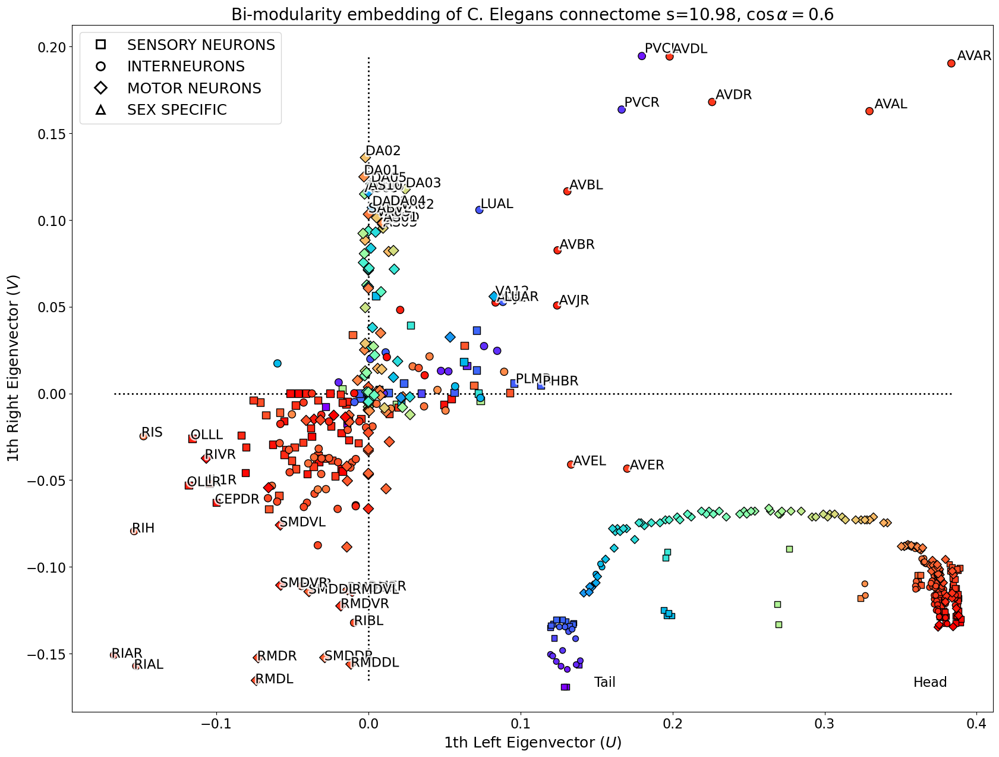

In [8]:
from matplotlib.lines import Line2D

n_cmap_points = 100
alpha_perc = 20
FAST = True

fig, axes = plt.subplots(figsize=(2*10, 15))

eig_id = np.where(S > 1e-10)[0][0]

graph = nx.DiGraph(wiring_sym)
graph_pos = {i: (U[i, eig_id], V[i, eig_id]) for i in range(wiring_sym.shape[0])}

edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

for i, (_, target) in enumerate(graph.edges()):
    edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == bullmore_label[target]]["Type_num"].values[0]
    
colors = palette_rgb

#nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.05)
if not FAST:
    nx.draw_networkx_edges(graph, pos=graph_pos, edge_color=colors_edges[edge_colors],
                        alpha=edge_a, connectionstyle=edge_cs)

x_norm = bullmore_pos[:, 0] + 0.4
y_norm = (bullmore_pos[:, 1] - bullmore_pos[:, 1].min())
ap_angle = np.arctan2(y_norm/np.abs(y_norm).max(), x_norm/np.abs(x_norm).max())
ap_angle = n_cmap_points*(ap_angle - ap_angle.min())/(ap_angle.max() - ap_angle.min())

angle_cmap = plt.get_cmap("rainbow_r", n_cmap_points)
ap_colors = np.array([angle_cmap(a) for a in ap_angle.astype(int)])

#axes_pos = [0.51, 0.128, 0.38, 0.22]
#axes_pos = [0.14, 0.128, 0.21, 0.11]
if eig_id == 1:
    axes_pos = [0.12, 0.128, 0.32, 0.16]
else:
    axes_pos = [0.51, 0.128, 0.38, 0.22]

#display_axes = fig.add_axes(axes_pos, facecolor="w")
display_axes = fig.add_axes(axes_pos, facecolor="none")
display_axes.spines[:].set_visible(False)
display_axes.text(0.5, 0, "Head", fontsize=16, ha="right")
display_axes.text(-0.5, 0, "Tail", fontsize=16)
graph_pos = {i: (x_norm[i], y_norm[i]) for i in range(wiring_sym.shape[0])}
if not FAST:
    nx.draw_networkx_edges(nx.Graph(wiring_sym), pos=graph_pos, alpha=.05, ax=display_axes)

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]

    #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    #axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
    #             zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])
    axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=ap_colors[type_mask], s=80, label=n_type,
                 zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])
    
    display_axes.scatter(x_norm[type_mask], y_norm[type_mask], color=ap_colors[type_mask],
                         s=50, edgecolor="k", lw=1, marker=markers[i])

#label_filter = ["AVAL", "AVAR", "AVEL", "AVER", "RIAR", "RIAL"]
label_filter = ["PHAL", "PHAR", "PHBL", "PHBR", "PHCR", "PHCL", "PLMR", "PLML"]
#for i, neuron in enumerate(bullmore_label):

squared_rad = U[:, eig_id] ** 2 + V[:, eig_id] ** 2
by_radius = np.argsort(squared_rad)
alpha_vector = (squared_rad > np.percentile(squared_rad, 100-alpha_perc)).astype(int)

#for i, neuron in enumerate(nodes_labels):
for i in by_radius:
    #if neuron in label_filter:
    #if nodes_labels[i] in label_filter:
    if True:
        #axes.text(1.01*U[i, eig_id], 1.01*V[i, eig_id], neuron, fontsize=16, alpha=alpha_vector[i],
        axes.text(1.01*U[i, eig_id], 1.01*V[i, eig_id], nodes_labels[i], fontsize=16, alpha=alpha_vector[i],
                  path_effects=[
                      withStroke(
                          linewidth=4,
                          foreground="w",
                          alpha=0.8*alpha_vector[i]
                          )])

x_max, y_max = np.max(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)
x_min, y_min = np.min(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)

abs_min = max([x_min, y_min])
abs_max = min([x_max, y_max])

#axes.plot([abs_min, abs_max], [abs_min, abs_max], color="tab:orange")
axes.plot([0, 0], [y_min, y_max], ls=":", lw=2, color="k", zorder=0)
axes.plot([x_min, x_max], [0, 0], ls=":", lw=2, color="k", zorder=0)

legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
                          markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]
#all_axes.legend(handles=legend_elements, loc="lower right", fontsize=16, title="Connection density")
axes.legend(handles=legend_elements, fontsize=18)

axes.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
axes.set_xlabel(f"{eig_id + 1}th Left Eigenvector ($U$)", fontsize=18)
axes.set_ylabel(f"{eig_id + 1}th Right Eigenvector ($V$)", fontsize=18)
angle = U[:, eig_id] @ V[:, eig_id]
axes.set_title("Bi-modularity embedding of C. Elegans connectome" + f" s={S[eig_id]:1.2f}, $\cos\\alpha={angle:1.1f}$", fontsize=20)

display_axes.set_xticks([])
_ = display_axes.set_yticks([])

# Figure-02-eig00-Uneven-v00-Overleaf.png
fig.savefig(op.join(path_to_figures, f"Figure-02BIS-eig{eig_id:02d}{'-NoSex'*no_sex}{'-Gap'*gap_junc}-v00.png"), bbox_inches='tight', dpi=100)

Plotting the 1th singular vectors


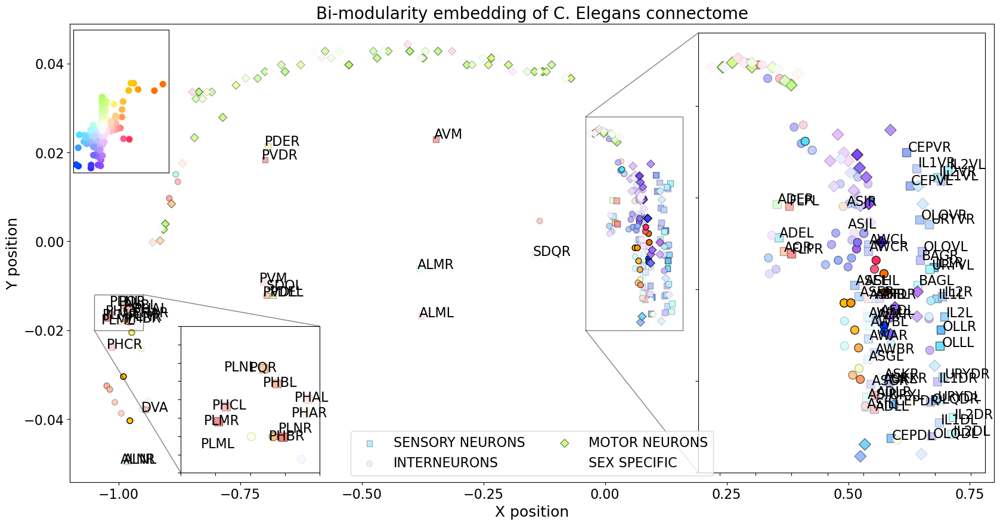

In [29]:
from matplotlib.colors import hsv_to_rgb

eig_id = np.where(S > 1e-10)[0][0]

print(f"Plotting the {eig_id+1}th singular vectors")

angles = np.arctan2(U[:, eig_id], V[:, eig_id])
angles = np.arctan2(V[:, eig_id], U[:, eig_id])

angles_prop = angles/(2*np.pi)
angles_prop[angles_prop < 0] = 1+angles_prop[angles_prop < 0]

angle_offset = 0
angles_prop += angle_offset

percent_radius = 0.8
percent_radius = 0.5
radius = np.sqrt(U[:, eig_id]**2 + V[:, eig_id]**2)
radius = np.clip(radius/(radius.max()*percent_radius), a_min=0, a_max=1)

by_radius = np.argsort(radius)

x_pos = bullmore_pos[:, 0]
y_pos = bullmore_pos[:, 1]

graph_pos = {i: (x, y) for i, (x, y) in enumerate(zip(x_pos, y_pos))}

colors = [hsv_to_rgb([a, r, 1]) for a, r in zip(angles_prop, radius)]

#fig, axes = plt.subplots(ncols=2, figsize=(30, 10), gridspec_kw={"wspace":0.01, "width_ratios":[4, 1]})
fig, axes = plt.subplots(figsize=(20, 10))

axes = [axes]

# Preparing the zoom
x1, x2, y1, y2 = 0, 0.2, -0.02, 0.02
x1, x2, y1, y2 = -0.04, 0.16, -0.02, 0.028
axes[0].set_xlim(-1.1, .8)

mask = np.logical_and(x_pos > x1, y_pos < y1)
subgraph = nx.Graph(wiring_sym[mask][:, mask])

axins = axes[0].inset_axes(
    #[0.7, 0.05, 0.28, 0.9],
    [0.68, 0.02, 0.31, 0.96],
    #[0.7, 0.05, 0.28, 0.45],
    #[0.5, 0.5, 0.47, 0.47],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])

# 2nd zoom

x12, x22, y12, y22 = -1.05, -0.95, -0.02, -0.012
ax_zoom2 = axes[0].inset_axes(
    [0.12, 0.02, 0.15, 0.32],
    xlim=(x12, x22), ylim=(y12, y22), xticklabels=[], yticklabels=[])

graph = nx.DiGraph(wiring_sym)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[0], alpha=.025)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[0], alpha=.03, connectionstyle="arc3")

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]


    #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    #axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
    #             zorder=3, edgecolor="k", lw=1, alpha=1)
    
    edge_colors = [(0, 0, 0, r) for r in radius[type_mask]]
    axes[0].scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                    s=50, edgecolor=edge_colors, linewidths=1, marker=markers[i], zorder=2, label=n_type)
    

    axins.scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                  s=100, edgecolor=edge_colors, linewidths=1, marker=markers[i], zorder=2)
    
    ax_zoom2.scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                  s=100, edgecolor=edge_colors, linewidths=1, marker=markers[i], zorder=2)

type_higlight=0
for i, neuron in enumerate(bullmore_label):
    if (x_pos[i] < x1 or y_pos[i] > y2) and bullmore_type_num[i] == type_higlight:
        #axes[0].text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16, alpha=radius[i])
        axes[0].text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16)#, alpha=alpha_vector[i])
    #axes.text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=12, alpha=radius[by_radius][i])
    if (x_pos[i] < x22 and y_pos[i] < y22 and y_pos[i] > y12) and bullmore_type_num[i] == type_higlight:
        ax_zoom2.text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16)

# Plotting the zoom
#axins.imshow(Z2, origin="lower")
#axins.scatter(np.array(x_pos)[by_radius], np.array(y_pos)[by_radius], color=np.array(colors)[by_radius],
#              s=200, alpha=.8, edgecolor="k", linewidths=1, zorder=2)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axins, alpha=.025)

for i, neuron in enumerate(bullmore_label):
    if x_pos[i] > x1 and y_pos[i] < y2 and bullmore_type_num[i] == type_higlight:
        #axins.text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16, alpha=radius[i])
        axins.text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16)#, alpha=alpha_vector[i])

axes[0].indicate_inset_zoom(axins, edgecolor="black")
axes[0].indicate_inset_zoom(ax_zoom2, edgecolor="black")

#axes[1].scatter(U[:, eig_id], V[:, eig_id], color=colors, s=80, edgecolor="w", linewidths=1)

# Plotting the colorbar
#display_axes = fig.add_axes([0.14, 0.64, 0.07, 0.21])
display_axes = fig.add_axes([0.128, 0.63, 0.08, 0.24])

display_axes.scatter(U[:, eig_id], V[:, eig_id], color=colors, s=50)#, linewidths=1, edgecolor="w")

display_axes.set_xticks([])
display_axes.set_yticks([])
minval = np.concatenate([U[:, eig_id], V[:, eig_id]]).min()
maxval = np.concatenate([U[:, eig_id], V[:, eig_id]]).max()
display_axes.set_xlim(minval*1.1, maxval*1.1)
display_axes.set_ylim(minval*1.1, maxval*1.1)


#axes[1].set_title("Corresponding HSV colormap", fontsize=20)
#axes[1].set_xticks([])
#axes[1].set_yticks([])
#minval = np.concatenate([U[:, eig_id], V[:, eig_id]]).min()
#maxval = np.concatenate([U[:, eig_id], V[:, eig_id]]).max()
#axes[1].set_xlim(minval*1.1, maxval*1.1)
#axes[1].set_ylim(minval*1.1, maxval*1.1)

axes[0].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16)
axes[0].set_xlabel("X position", fontsize=18)
axes[0].set_ylabel("Y position", fontsize=18)
#axes[0].set_title("1D representation of Bi-Modularity")
axes[0].set_title("Bi-modularity embedding of C. Elegans connectome", fontsize=20)
axes[0].legend(fontsize=16, ncols=2, loc="lower center")

R^2 = 0.06465943517852257


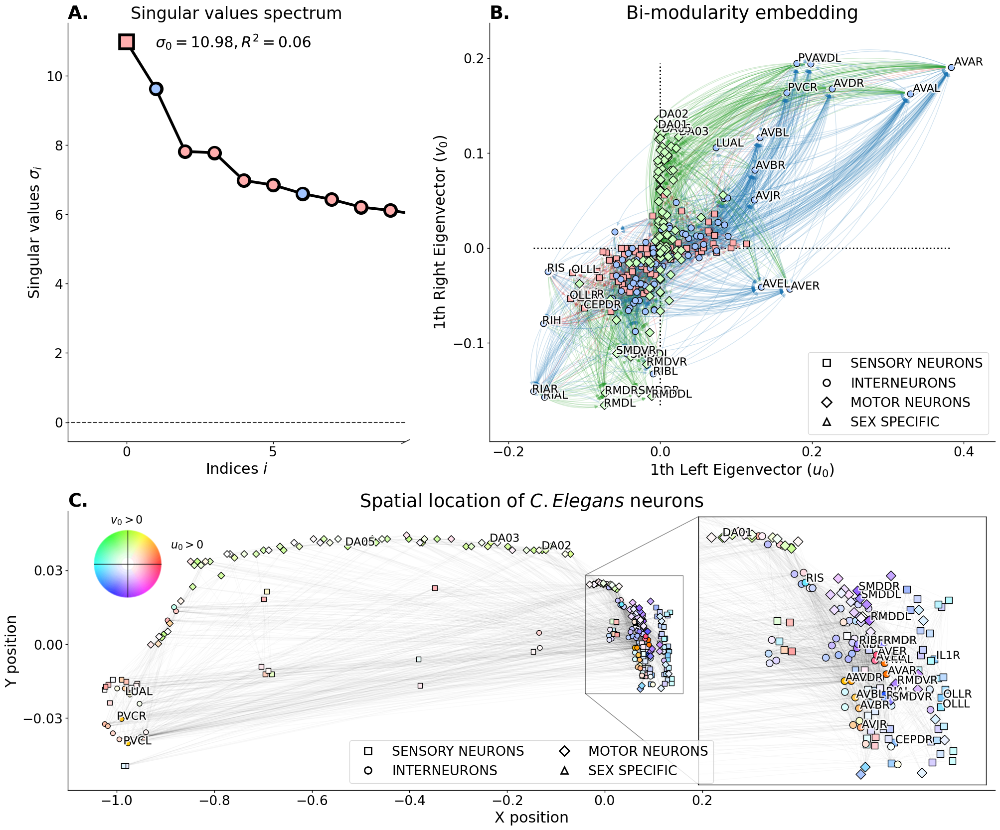

In [13]:
# Composite Figure
from matplotlib.colors import hsv_to_rgb
from matplotlib.colors import Normalize
from matplotlib.colorbar import ColorbarBase

importlib.reload(plot)

import matplotlib
matplotlib.rcParams['axes.linewidth'] = 1
matplotlib.rcParams['xtick.major.width'] = 1
matplotlib.rcParams['ytick.major.width'] = 1


fontscale = 1.2
alpha_perc = 88
show_markers = True
uneven_ratios = 0.5
testing = False
eig_id = np.where(S > 1e-10)[0][0]
#eig_id = -1

#fig, all_axes = plt.subplots(nrows=2, figsize=(2*10, 2*10), height_ratios=[1 + uneven_ratios, 1])
fig, all_axes = plt.subplots(nrows=2, figsize=(2*12, 2*10), height_ratios=[1 + uneven_ratios, 1])
suffix = "Rect" + "_".join([f"{inch:1.0f}" for inch in fig.get_size_inches()])

gs1 = GridSpecFromSubplotSpec(1, 2, subplot_spec=all_axes[0], width_ratios=[1, 1 + uneven_ratios])

axes = [fig.add_subplot(gs1[0]), fig.add_subplot(gs1[1]), fig.add_subplot(all_axes[1])]

all_axes[0].set_xticks([])
all_axes[0].set_yticks([])
all_axes[0].spines[:].set_visible(False)


#################################################################################
###     First plot
#################################################################################

axes[0] = plot.plot_spectrum(wiring_sym, vector_id=eig_id, write_s=True, fig=fig,
                             split_ax=False,
                             ax=axes[0], fontscale=fontscale, fix_negative=False,
                             override_title="Singular values spectrum", title_letter="A.")


#################################################################################
###     Second plot
#################################################################################
graph = nx.DiGraph(wiring_sym)
graph_pos = {i: (U[i, eig_id], V[i, eig_id]) for i in range(wiring_sym.shape[0])}

if not testing:
    edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

    for i, (_, target) in enumerate(graph.edges()):
        edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == bullmore_label[target]]["Type_num"].values[0]
        
    colors = palette_rgb

    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.05)
    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.05, ax=axes[1])
    nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[1], edge_color=colors_edges[edge_colors],
                           alpha=edge_a, connectionstyle=edge_cs)

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]

    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    axes[1].scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
                    zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])

alpha_factor = 0.2
alpha_threshold = 0.45
squared_rad = U[:, eig_id] ** 2 + V[:, eig_id] ** 2
alpha_vector = squared_rad
alpha_vector = np.clip(alpha_vector/(alpha_vector.max() * alpha_factor), a_min=0, a_max=1)

alpha_vector[alpha_vector < alpha_threshold] = 0
alpha_vector = (squared_rad > np.percentile(squared_rad, alpha_perc)).astype(int)

sorted_by_radius = np.argsort(squared_rad)

#for i, neuron in enumerate(nodes_labels):
for i in sorted_by_radius:
    #if neuron in label_filter:
    if True:
        axes[1].text(1.01*U[i, eig_id], 1.01*V[i, eig_id], nodes_labels[i], fontsize=16, alpha=alpha_vector[i],
                     path_effects=[
                         withStroke(
                             linewidth=4,
                             foreground="w",
                             alpha=0.8*alpha_vector[i],
                             )])

x_max, y_max = np.max(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)
x_min, y_min = np.min(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)

abs_min = max([x_min, y_min])
abs_max = min([x_max, y_max])

#axes.plot([abs_min, abs_max], [abs_min, abs_max], color="tab:orange")
axes[1].plot([0, 0], [y_min, y_max], ls=":", lw=2, color="k", zorder=0)
axes[1].plot([x_min, x_max], [0, 0], ls=":", lw=2, color="k", zorder=0)

#################################################################################
###     Third plot
#################################################################################

angles = np.arctan2(U[:, eig_id], V[:, eig_id])
angles = np.arctan2(V[:, eig_id], U[:, eig_id])

angles_prop = angles/(2*np.pi)
angles_prop[angles_prop < 0] = 1+angles_prop[angles_prop < 0]

angle_offset = 0
angles_prop += angle_offset

percent_radius = 0.6
radius = np.sqrt(U[:, eig_id]**2 + V[:, eig_id]**2)
radius = np.clip(radius/(radius.max()*percent_radius), a_min=0, a_max=1)

by_radius = np.argsort(radius)

x_pos = bullmore_pos[:, 0]
y_pos = bullmore_pos[:, 1]

graph_pos = {i: (x, y) for i, (x, y) in enumerate(zip(x_pos, y_pos))}

colors = [hsv_to_rgb([a, r, 1]) for a, r in zip(angles_prop, radius)]

# Plotting the zoom
x1, x2, y1, y2 = -0.05, 0.17, -0.02, 0.028
x1, x2, y1, y2 = -0.04, 0.16, -0.02, 0.028
axes[2].set_xlim(-1.1, .8)

mask = np.logical_and(x_pos > x1, y_pos < y1)
subgraph = nx.Graph(wiring_sym[mask][:, mask])

axins = axes[2].inset_axes(
    #[0.7, 0.05, 0.28, 0.9],
    [0.68, 0.02, 0.31, 0.96],
    xlim=(x1, x2), ylim=(y1, y2), xticklabels=[], yticklabels=[])

axins.set_xticks([])
axins.set_yticks([])

graph = nx.Graph(wiring_sym)
nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[2], alpha=.025)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axes[2], alpha=.2,
#                       width=1.2, edge_color=colors_edges[edge_colors])

#axes[0].scatter(np.array(x_pos), np.array(y_pos), color=np.array(colors), s=200, alpha=.8, edgecolor="w", linewidths=1)
# axes[2].scatter(np.array(x_pos)[by_radius], np.array(y_pos)[by_radius], color=np.array(colors)[by_radius],
#                 s=100, alpha=.8, edgecolor="k", linewidths=1, zorder=2)

for i, n_type in enumerate(neuron_def_df["Type"].unique()):
    neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]


    #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
    type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
    #axes.scatter(U[type_mask, eig_id], V[type_mask, eig_id], color=colors[i], s=80, label=n_type,
    #             zorder=3, edgecolor="k", lw=1, alpha=1)
    
    #edge_colors = [(0, 0, 0, r) for r in radius[type_mask]]
    axes[2].scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                    s=50, edgecolor="k", lw=1, marker=markers[i], zorder=2)
    

    axins.scatter(np.array(x_pos)[type_mask], np.array(y_pos)[type_mask], color=np.array(colors)[type_mask],
                  s=100, edgecolor="k", lw=1, marker=markers[i], zorder=2)

for i, neuron in enumerate(bullmore_label):
    if x_pos[i] < x1 or y_pos[i] > y2:
        axes[2].text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16, alpha=alpha_vector[i],
                     path_effects=[
                         withStroke(
                             linewidth=4,
                             foreground="w",
                             alpha=0.8*alpha_vector[i],
                             )])

#axins.scatter(np.array(x_pos)[by_radius], np.array(y_pos)[by_radius], color=np.array(colors)[by_radius],
#              s=100, alpha=.8, edgecolor="k", linewidths=1, zorder=2)

nx.draw_networkx_edges(graph, pos=graph_pos, ax=axins, alpha=.025)
#nx.draw_networkx_edges(graph, pos=graph_pos, ax=axins, alpha=.2, 
#                       width=1.2, edge_color=colors_edges[edge_colors])

for i, neuron in enumerate(bullmore_label):
    if x_pos[i] > x1 and y_pos[i] < y2:
        axins.text(1.01*x_pos[i], 1.01*y_pos[i], neuron, fontsize=16, alpha=alpha_vector[i],
                path_effects=[
                    withStroke(
                        linewidth=4,
                        foreground="w",
                        alpha=0.8*alpha_vector[i],
                        )])

axes[2].indicate_inset_zoom(axins, edgecolor="black")

# Plotting the colorbar
polar_pos = [0.14, 0.37, 0.07, 0.07]
if uneven_ratios == 0.5:
    polar_pos = [0.14, 0.302, 0.07, 0.07]
elif uneven_ratios == 1:
    polar_pos = [0.14, 0.26, 0.07, 0.07]

display_axes = fig.add_axes(polar_pos, projection='polar')
#display_axes._direction = 2*np.pi 
#norm = Normalize(0.0, 2*np.pi)
#
#quant_steps = 512
#cb = ColorbarBase(display_axes, cmap=plt.get_cmap('hsv', quant_steps),
#                  norm=norm, orientation='horizontal')

quant_steps = 256
radius_power = 3
radius_max = 0.3

all_angles = np.linspace(0, 2*np.pi, quant_steps)[:-1]
all_radiuses = np.linspace(0, 1, quant_steps//4)

cmap = plt.get_cmap('hsv', quant_steps)

all_points = np.array([[a, r] for a in all_angles for r in all_radiuses])
all_colors = np.array([cmap(a/(2*np.pi))[:3] + (radius_max * r ** radius_power,) for a in all_angles for r in all_radiuses])

display_axes.scatter(all_points[:, 0], all_points[:, 1], s=20, color=all_colors, marker=".", edgecolors="none")

display_axes.plot([0, np.pi], [1]*2, ls="-", lw=1, color="k", zorder=2)
display_axes.plot([np.pi/2, -np.pi/2], [1]*2, ls="-", lw=1, color="k", zorder=2)

axes[2].text(-0.98, 0.049, f"$v_{{{eig_id}}}>0$", ha="center", fontsize=16)
axes[2].text(-0.89, 0.039, f"$u_{{{eig_id}}}>0$", fontsize=16)

# aesthetics - get rid of border and axis labels                                   
display_axes.set_axis_off()

legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
                          markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]

# Parameters
axes[1].set_title(f"B.", fontsize=22 * fontscale, loc="left", fontdict={"fontweight": "bold"})
axes[1].set_title(f"Bi-modularity embedding", fontsize=22 * fontscale)
#axes[1].set_title(f"Bi-modularity embedding $s_{{{eig_id+1}}}={S[eig_id]:1.2f}$", fontsize=22 * fontscale)
axes[1].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16 * fontscale)
axes[1].set_xticks(np.linspace(-0.2, .4, 4))
axes[1].set_yticks(np.linspace(-.1, .2, 4))
axes[1].set_xlabel(f"{eig_id + 1}th Left Eigenvector ($u_{{{eig_id}}}$)", fontsize=18 * fontscale)
axes[1].set_ylabel(f"{eig_id + 1}th Right Eigenvector ($v_{{{eig_id}}}$)", fontsize=18 * fontscale)
axes[1].spines[["top", "right"]].set_visible(False)
#axes[1].legend(fontsize=16 * fontscale, loc="lower right")
axes[1].legend(handles=legend_elements, fontsize=16 * fontscale, loc="lower right")

axes[2].set_title(f"C.", fontsize=22 * fontscale, loc="left", fontdict={"fontweight": "bold"})
axes[2].set_title("Spatial location of $\it{C. Elegans}$ neurons", fontsize=22 * fontscale)
axes[2].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16 * fontscale)
axes[2].set_xticks(np.linspace(-1, .2, 7))
axes[2].set_yticks(np.linspace(-.03, .03, 3))
axes[2].set_xlabel("X position", fontsize=18 * fontscale)
axes[2].set_ylabel("Y position", fontsize=18 * fontscale)
axes[2].spines[["top", "right"]].set_visible(False)
#all_axes.legend(handles=legend_elements, loc="lower right", fontsize=16, title="Connection density")
axes[2].legend(handles=legend_elements, ncols=2, fontsize=16 * fontscale, loc="lower center")

if not testing:
    fig.savefig(op.join(path_to_figures, f"Figure-02-eig{eig_id:02d}-v00-{suffix}.png"), dpi=600, bbox_inches="tight")

    # Overleaf version
    fig.savefig(op.join(path_to_figures, f"Figure-02-eig{eig_id:02d}{'-Uneven'*(uneven_ratios > 0)}{'-noSex'*no_sex}{'-Gap'*gap_junc}-v00-Overleaf{suffix}.png"),
                dpi=100, bbox_inches="tight")

## Sinks and sources

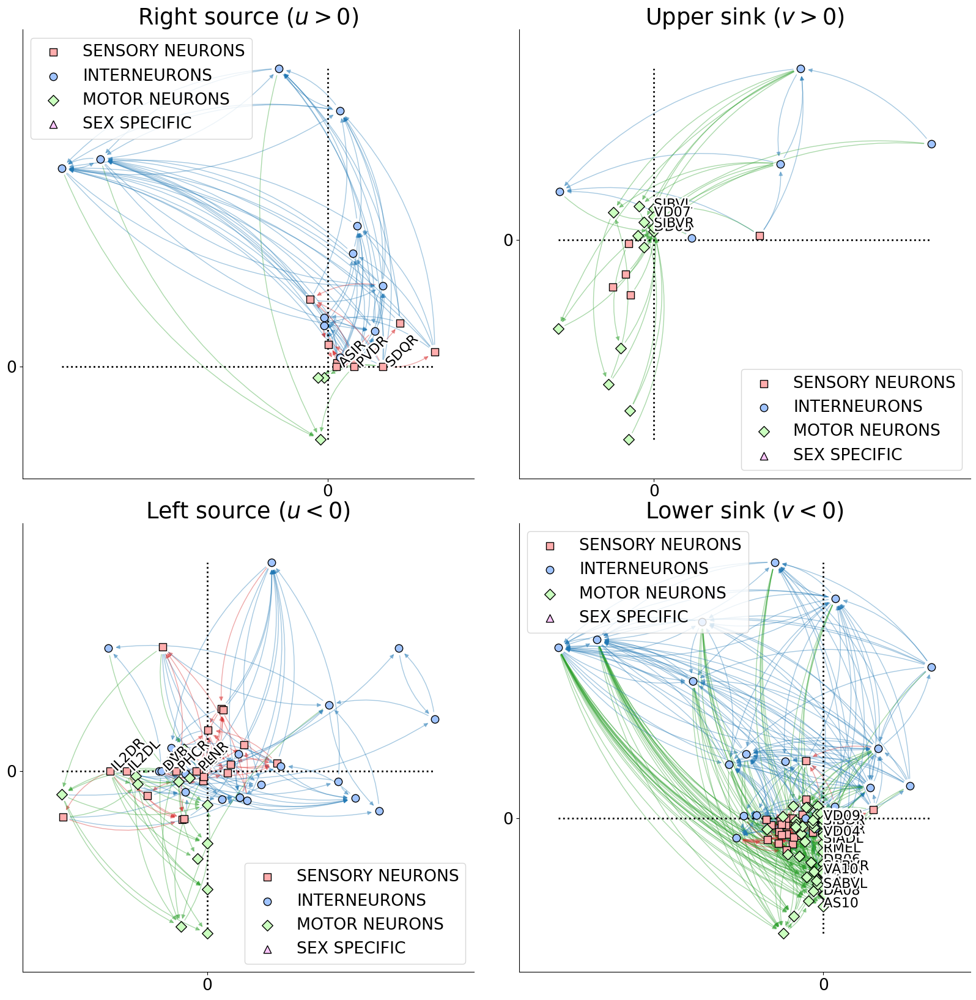

In [20]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20),
                         #sharex="row", sharey="row",
                         gridspec_kw={"wspace":0.1, "hspace":0.1})

eig_id = np.where(S > 1e-10)[0][0]+1

zero_deg_thresh = 0
eig_thresh = 0
#min_con = 3

titles = [f"Right source ($u>{eig_thresh}$)",
          f"Left source ($u<{eig_thresh}$)",
          f"Upper sink ($v>{eig_thresh}$)",
          f"Lower sink ($v<{eig_thresh}$)"]

for ax_i, ax_col in enumerate(axes.T):
    for ax_j, ax in enumerate(ax_col):

        wiring_red = wiring_sym.copy()
        if ax_j == 0:
            sink_source = np.logical_and(wiring_red.sum(axis=ax_i) <= zero_deg_thresh, [U, V][ax_i][:, eig_id] > eig_thresh, dtype=bool)
            #sink_source = np.logical_and(sink_source, wiring_red.sum(axis=1-ax_i) > min_con, dtype=bool)
        else:
            sink_source = np.logical_and(wiring_red.sum(axis=ax_i) <= zero_deg_thresh, [U, V][ax_i][:, eig_id] < -eig_thresh, dtype=bool)
            #sink_source = np.logical_and(sink_source, wiring_red.sum(axis=1-ax_i) > min_con, dtype=bool)

        mask = (wiring_red[sink_source].sum(axis=0) > 0) + (wiring_red[:, sink_source].sum(axis=1) > 0)
        mask = (mask + sink_source).astype(bool)

        wiring_red = wiring_red[mask][:, mask]
        labels_red = nodes_labels[mask]
        U_red = U[mask]
        V_red = V[mask]

        graph = nx.DiGraph(wiring_red)
        graph_pos = {i: (U_red[i, eig_id], V_red[i, eig_id]) for i in range(wiring_red.shape[0])}
        
        mycmap = plt.get_cmap("tab20")
        colors_edge = np.array(["tab:red", "tab:blue", "tab:green", "tab:gray"])
        colors = np.array(palette_rgb)

        edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

        for i, (_, target) in enumerate(graph.edges()):
            edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == labels_red[target]]["Type_num"].values[0]
        #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.1, ax=ax)
        nx.draw_networkx_edges(graph, pos=graph_pos, edge_color=colors_edge[edge_colors], alpha=2*edge_a, ax=ax, connectionstyle=edge_cs)

        ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

        for i, n_type in enumerate(neuron_def_df["Type"].unique()):
            neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]

            type_mask = np.array([lab in neurons_in_type.values for lab in labels_red])
            ax.scatter(U_red[type_mask, eig_id], V_red[type_mask, eig_id], color=colors[i], s=80, label=n_type,
                       zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])

        label_filter = ["AVAL", "AVAR", "AVEL", "AVER", "RIAR", "RIAL"]
        #for i, neuron in enumerate(bullmore_label):
        for i, neuron in enumerate(labels_red):
            #if neuron in label_filter:
            #if True:
            if neuron in nodes_labels[sink_source]:
                ax.text(1.01*U_red[i, eig_id], 1.01*V_red[i, eig_id], neuron,
                        fontsize=16, rotation=45*(1-ax_i), path_effects=[
                            withStroke(
                                linewidth=4,
                                foreground="w",
                                #alpha=0.8*alpha_vector[i],
                                )]
                                )

        #x_max, y_max = np.max(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)
        #x_min, y_min = np.min(np.vstack([U[:, eig_id], V[:, eig_id]]), axis=1)
        x_max, y_max = np.max(np.vstack([U_red[:, eig_id], V_red[:, eig_id]]), axis=1)
        x_min, y_min = np.min(np.vstack([U_red[:, eig_id], V_red[:, eig_id]]), axis=1)

        abs_min = max([x_min, y_min])
        abs_max = min([x_max, y_max])

        #axes.plot([abs_min, abs_max], [abs_min, abs_max], color="tab:orange")
        ax.plot([0, 0], [y_min, y_max], ls=":", lw=2, color="k")
        ax.plot([x_min, x_max], [0, 0], ls=":", lw=2, color="k")

        ax.set_title(titles[ax_i*2 + ax_j], fontsize=22 * fontscale)
        ax.spines[["top", "right"]].set_visible(False)
        ax.set_xticks([0])
        ax.set_yticks([0])
        ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16 * fontscale)
        ax.legend(fontsize=16 * fontscale)
        
fig.savefig(op.join(path_to_figures, f"SI-CEleg-SourcesSinks{eig_id:02d}{'-noSex'*no_sex}-v00.png"), dpi=600, bbox_inches="tight")

# Overleaf version
fig.savefig(op.join(path_to_figures, f"SI-CEleg-SourcesSinks{eig_id:02d}{'-noSex'*no_sex}-v00-Overleaf.png"), dpi=100, bbox_inches="tight")

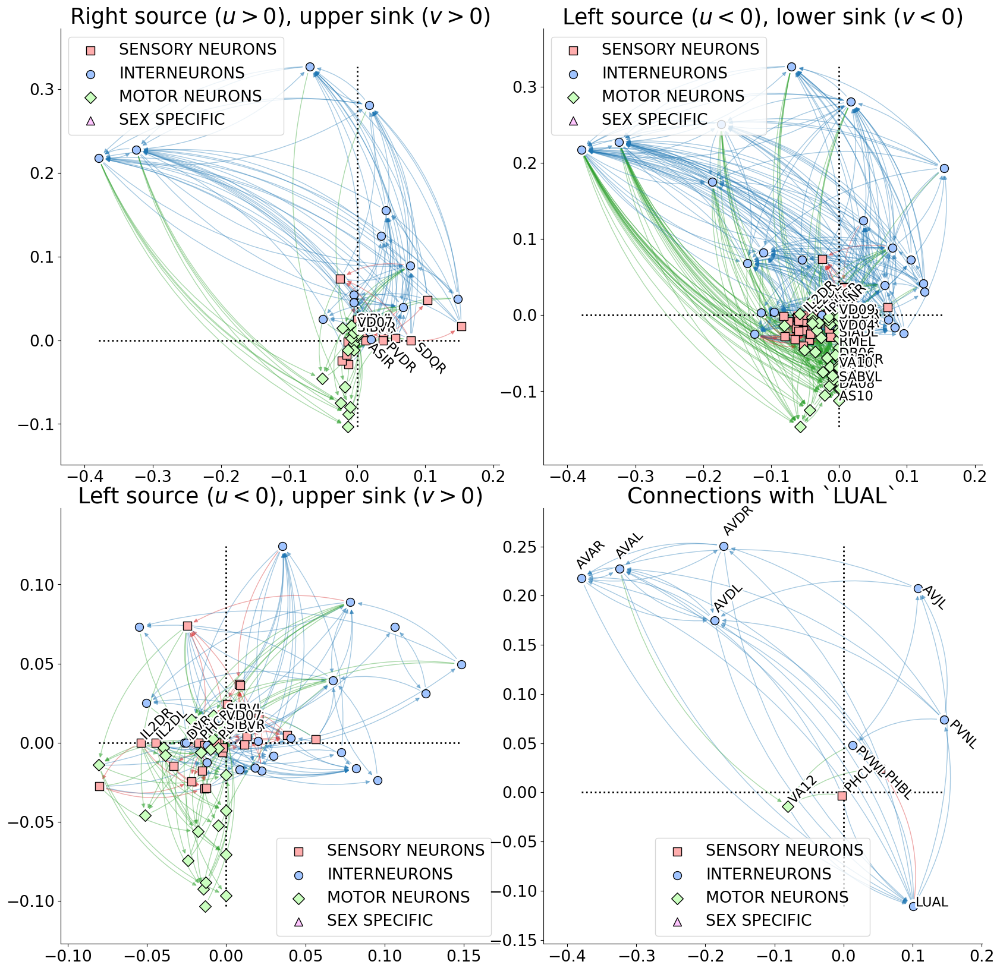

In [19]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(20, 20),
                         #sharex=True, sharey=True,
                         gridspec_kw={"wspace":0.1, "hspace":0.1})

node_size = 100

show_overlap = False
eig_id = np.where(S > 1e-10)[0][0]+1

titles = ["Right source ($u>0$), upper sink ($v>0$)",
          "Left source ($u<0$), lower sink ($v<0$)",
          "Left source ($u<0$), upper sink ($v>0$)",
          #"Connections NOT WITH `AVE`",
          "Connections with `LUAL`"]
          #"Connections with `AVE`"]

zero_deg_thresh = 0
eig_thresh = 0

mask_list = []
for ax_i, ax in enumerate(axes.flatten()):

    wiring_red = wiring_sym.copy()

    invert_mask = False
    if ax_i == 0:
        sink = np.logical_and(wiring_red.sum(axis=1) <= zero_deg_thresh, V[:, eig_id] > eig_thresh, dtype=bool)
        source = np.logical_and(wiring_red.sum(axis=0) <= zero_deg_thresh, U[:, eig_id] > eig_thresh, dtype=bool)
    elif ax_i == 1:
        sink = np.logical_and(wiring_red.sum(axis=1) <= zero_deg_thresh, V[:, eig_id] < -eig_thresh, dtype=bool)
        source = np.logical_and(wiring_red.sum(axis=0) <= zero_deg_thresh, U[:, eig_id] < -eig_thresh, dtype=bool)
    elif ax_i == 2:
        sink = np.logical_and(wiring_red.sum(axis=1) <= zero_deg_thresh, V[:, eig_id] > eig_thresh, dtype=bool)
        source = np.logical_and(wiring_red.sum(axis=0) <= zero_deg_thresh, U[:, eig_id] < -eig_thresh, dtype=bool)
    #elif ax_i == 2:
    #    sink = np.array([lab in ["AVEL", "AVER"] for lab in nodes_labels])
    #    source = sink
    #    invert_mask = True
    else:
        #sink = np.array([lab in ["AVEL", "AVER"] for lab in nodes_labels])
        sink = np.array([lab in ["LUAL"] for lab in nodes_labels])
        source = sink

    sink_source = np.logical_or(sink, source, dtype=bool)

    mask = (wiring_red[sink_source].sum(axis=0) > 0) + (wiring_red[:, sink_source].sum(axis=1) > 0)
    mask = (mask + sink_source).astype(bool)

    if invert_mask:
        mask = ~mask

    mask_list.append(mask)

    wiring_red = wiring_red[mask][:, mask]
    labels_red = nodes_labels[mask]
    sink_red = sink[mask]
    source_red = source[mask]
    U_red = U[mask]
    V_red = V[mask]

    graph = nx.DiGraph(wiring_red)
    graph_pos = {i: (U_red[i, eig_id], V_red[i, eig_id]) for i in range(wiring_red.shape[0])}
    
    mycmap = plt.get_cmap("tab20")
    colors_edge = np.array(["tab:red", "tab:blue", "tab:green", "tab:gray"])
    colors = np.array(palette_rgb)

    edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

    for i, (_, target) in enumerate(graph.edges()):
        edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == labels_red[target]]["Type_num"].values[0]
    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.1, ax=ax)
    nx.draw_networkx_edges(graph, pos=graph_pos, edge_color=colors_edge[edge_colors],
                           alpha=2*edge_a, ax=ax, connectionstyle=edge_cs)

    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

    for i, n_type in enumerate(neuron_def_df["Type"].unique()):
        neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]

        type_mask = np.array([lab in neurons_in_type.values for lab in labels_red])
        ax.scatter(U_red[type_mask, eig_id], V_red[type_mask, eig_id], color=colors[i], s=node_size, label=n_type,
                       zorder=3, edgecolor="k", lw=1, alpha=1, marker=markers[i])

    if not show_overlap:
        for i, neuron in enumerate(labels_red):
            if neuron in nodes_labels[sink_source] or ax_i > 2:
                rot = 45
                va = "bottom"
                if sink_red[i]:
                    rot = 0
                elif U_red[i, eig_id] > 0:
                    rot = -45
                    va = "top"
                ax.text(1.03*U_red[i, eig_id], 1.03*V_red[i, eig_id], neuron,
                        rotation=rot, fontsize=16, va=va, path_effects=[
                            withStroke(
                                linewidth=4,
                                foreground="w",
                                #alpha=0.8*alpha_vector[i],
                                )]
                                )

    x_max, y_max = np.max(np.vstack([U_red[:, eig_id], V_red[:, eig_id]]), axis=1)
    x_min, y_min = np.min(np.vstack([U_red[:, eig_id], V_red[:, eig_id]]), axis=1)

    abs_min = max([x_min, y_min])
    abs_max = min([x_max, y_max])

    ax.plot([0, 0], [y_min, y_max], ls=":", lw=2, color="k")
    ax.plot([x_min, x_max], [0, 0], ls=":", lw=2, color="k")

    ax.set_title(titles[ax_i], fontsize=22 * fontscale)
    ax.spines[["top", "right"]].set_visible(False)
    #ax.set_xticks([0])
    #ax.set_yticks([0])
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True, labelsize=16 * fontscale)
    ax.legend(fontsize=16 * fontscale)

#if show_overlap:
#    overlap = np.sum(mask_list, axis=0) == len(mask_list)
#    for node_id in np.where(overlap)[0]:
#        for ax in axes.flatten()[:-1]:
#            ax.scatter(U[node_id, eig_id], V[node_id, eig_id], color="none", s=node_size-10, edgecolor="tab:orange", lw=2, alpha=.5, zorder=4)
#            ax.text(1.03*U[node_id, eig_id], 1.03*V[node_id, eig_id], nodes_labels[node_id], fontsize=12)

fig.savefig(op.join(path_to_figures, f"SI-CEleg-Pathways{eig_id:02d}{'-noSex'*no_sex}-v00.png"), dpi=600, bbox_inches="tight")

# Overleaf version
fig.savefig(op.join(path_to_figures, f"SI-CEleg-Pathways{eig_id:02d}{'-noSex'*no_sex}-v00-Overleaf.png"), dpi=100, bbox_inches="tight")

## Separately projecting sending and receiving communities

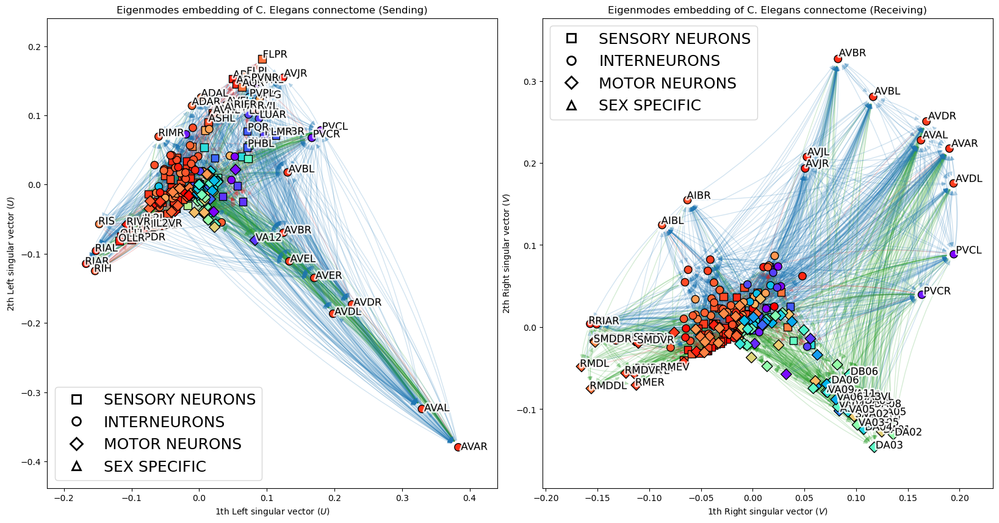

In [28]:
from matplotlib.patheffects import withStroke

fig, axes = plt.subplots(ncols=2, figsize=(20, 10), gridspec_kw={"wspace":0.1})

eig_id = np.where(S > 1e-10)[0][0]
second_id = 1
rad_perc = 20

x_pos = bullmore_pos[:, 0]
y_pos = bullmore_pos[:, 1]

eig_name = ["U", "V"]
side = ["Left", "Right"]
for ax_i, (ax, eigenvector) in enumerate(zip(axes, [U, V])):

    graph = nx.DiGraph(wiring_sym)
    graph_pos = {i: (eigenvector[i, eig_id], eigenvector[i, eig_id+second_id]) for i in range(wiring_sym.shape[0])}
    
    mycmap = plt.get_cmap("tab20")
    colors_edge = np.array(["tab:red", "tab:blue", "tab:green", "tab:gray"])
    colors = np.array(palette_rgb)

    edge_colors = np.zeros_like(np.array(graph.edges())[:, 0])

    for i, (_, target) in enumerate(graph.edges()):
        edge_colors[i] = neuron_def_df[neuron_def_df["Neuron"] == bullmore_label[target]]["Type_num"].values[0]
    #nx.draw_networkx_edges(graph, pos=graph_pos, alpha=.1, ax=ax)
    nx.draw_networkx_edges(graph, pos=graph_pos, edge_color=colors_edge[edge_colors], alpha=.2, width=1, ax=ax, connectionstyle="arc3,rad=0.1")

    markers = ["s", "o", "D", "^"]
    for i, n_type in enumerate(neuron_def_df["Type"].unique()):
        neurons_in_type = neuron_def_df.loc[neuron_def_df["Type"] == n_type, "Neuron"]
    # for i, n_type in enumerate(neuron_def_df["Type_long"].unique()):
    #     neurons_in_type = neuron_def_df.loc[neuron_def_df["Type_long"] == n_type, "Neuron"]

        #type_mask = np.array([lab in neurons_in_type.values for lab in bullmore_label])
        type_mask = np.array([lab in neurons_in_type.values for lab in nodes_labels])
        #ax.scatter(eigenvector[type_mask, eig_id], eigenvector[type_mask, eig_id+second_id], color=colors[i], s=80, label=n_type,
        avg_pos = x_pos - np.sign(x_pos + 0.5) * y_pos * 5
        ax.scatter(eigenvector[type_mask, eig_id], eigenvector[type_mask, eig_id+second_id], c=avg_pos[type_mask], cmap="rainbow", s=80, label=n_type,
                    zorder=3, edgecolor="k", marker=markers[i], lw=1)
        #ax.scatter(eigenvector[type_mask, eig_id], eigenvector[type_mask, eig_id+2], color=mycmap(i), s=80, label=n_type,
        #         zorder=3, edgecolor="w", lw=1)

    label_filter = ["AVAL", "AVAR", "AVEL", "AVER", "RIAR", "RIAL"]
    #for i, neuron in enumerate(bullmore_label):


    radius = eigenvector[:, eig_id]**2 + eigenvector[:, eig_id+second_id]**2
    for i, neuron in enumerate(nodes_labels):
        #if neuron in label_filter:
        #if True:
        if radius[i] > np.percentile(radius, 100 - rad_perc):
            ax.text(1.01*eigenvector[i, eig_id], 1.01*eigenvector[i, eig_id+second_id],
                    neuron, fontsize=12, 
                    path_effects=[withStroke(linewidth=4, foreground="w", alpha=0.8)])


    legend_elements = [Line2D([0], [0], color="w", alpha=1, markersize=10, markeredgecolor="k",
                            markeredgewidth=2, marker=markers[i], label=type) for i, type in enumerate(neuron_def_df["Type"].unique())]
    
    loc=None
    if ax_i == 0:
        loc="lower left"
    
    ax.legend(handles=legend_elements, fontsize=18, loc=loc)
    
    ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax.set_xlabel(f"{eig_id + 1}th {side[ax_i]} singular vector (${eig_name[ax_i]}$)")
    ax.set_ylabel(f"{eig_id + 1 + second_id}th {side[ax_i]} singular vector (${eig_name[ax_i]}$)")
    ax.set_title(f"Eigenmodes embedding of C. Elegans connectome ({['Sending', 'Receiving'][ax_i]})")
#axes.set_title("Eigenmodes embedding of C. Elegans connectome" + f" {U[:, eig_id].T@V[:, eig_id]:1.2f}")

# Figure-02-eig00-Uneven-v00-Overleaf.png

fig.savefig(op.join(path_to_figures, f"SI-CEleg-LeftRight{eig_id:02d}_{eig_id+second_id:02d}{'-noSex'*no_sex}-v00-Overleaf.png"),
            dpi=100, bbox_inches="tight")